In [76]:
import pandas as pd
import networkx as nx
import numpy as np
import seaborn as sns

# Load the edges file (already loaded in previous step, but re-loading for completeness)
edges_df = pd.read_csv('marvel-unimodal-edges.csv')
nodes_df = pd.read_csv('marvel-unimodal-nodes.csv')

# Create the Graph object (undirected, weighted)
G = nx.from_pandas_edgelist(edges_df, source='Source', target='Target', edge_attr='Weight')

# 1. Total Nodes and Edges
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()

# 2. Network Density
# Density = 2 * |E| / (|V| * (|V| - 1)) for undirected graph
density = nx.density(G)

# 3. Connected Components
# Find all connected components
connected_components = list(nx.connected_components(G))
num_components = len(connected_components)

# Check if the graph is connected (i.e., has only one component)
is_connected = nx.is_connected(G)

# Find the Largest Connected Component (LCC)
if connected_components:
    # Get the largest component (set of nodes)
    lcc_nodes = max(connected_components, key=len)
    # Create the subgraph containing only the LCC
    LCC = G.subgraph(lcc_nodes).copy()
    
    # Calculate Diameter (longest shortest path) - only possible on connected graphs/components
    diameter = nx.diameter(LCC)
    
    # Calculate Radius - only possible on connected graphs/components
    radius = nx.radius(LCC)
    
    # Calculate Average Clustering Coefficient
    avg_clustering = nx.average_clustering(LCC)
else:
    LCC = None
    diameter = "N/A (No components)"
    radius = "N/A (No components)"
    avg_clustering = "N/A (No components)"

# 4. Weighted Density (requires a custom approach, as NetworkX doesn't have a direct function)
# A simple definition for Weighted Density is the Sum of Weights divided by the Max Possible Sum of Weights.
# Max possible sum of weights would be when all potential edges are present with the max weight observed.
# However, a more common and interpretable approach is to use the raw sum of weights for comparison.

sum_of_weights = edges_df['Weight'].sum()

# We can define a custom "Weighted Density" as:
# (Sum of Edge Weights) / (Number of Possible Edges * Max Edge Weight)
max_possible_edges = num_nodes * (num_nodes - 1) / 2
max_weight = edges_df['Weight'].max()

if max_possible_edges > 0 and max_weight > 0:
    weighted_density_custom = sum_of_weights / (max_possible_edges * max_weight)
else:
    weighted_density_custom = 0

# Summary of results
results = {
    "Metrica": [
        "Numero Totale di Nodi (|V|)",
        "Numero Totale di Archi (|E|)",
        "Componenti Connesse Totali",
        "Grafo Connesso?",
        "Densità della Rete",
        "Somma Totale dei Pesi degli Archi",
        "Densità Pesata (Custom, rispetto al Max Peso)",
        "Diametro (Componente più Grande)",
        "Raggio (Componente più Grande)",
        "Coefficiente di Clustering Medio (Componente più Grande)"
    ],
    "Valore": [
        num_nodes,
        num_edges,
        num_components,
        is_connected,
        f"{density:.4f}",
        sum_of_weights,
        f"{weighted_density_custom:.4f}",
        diameter,
        radius,
        f"{avg_clustering:.4f}"
    ]
}

results_df = pd.DataFrame(results)
# Converti tutto a stringa
results_df_str = results_df.astype(str)

# Stampa con allineamento a sinistra
for col in results_df_str.columns:
    results_df_str[col] = results_df_str[col].str.ljust(results_df_str[col].str.len().max())

print(results_df_str.to_string(index=False))

                                                 Metrica Valore
Numero Totale di Nodi (|V|)                              327   
Numero Totale di Archi (|E|)                             9891  
Componenti Connesse Totali                               1     
Grafo Connesso?                                          True  
Densità della Rete                                       0.1856
Somma Totale dei Pesi degli Archi                        216765
Densità Pesata (Custom, rispetto al Max Peso)            0.0055
Diametro (Componente più Grande)                         3     
Raggio (Componente più Grande)                           2     
Coefficiente di Clustering Medio (Componente più Grande) 0.7047


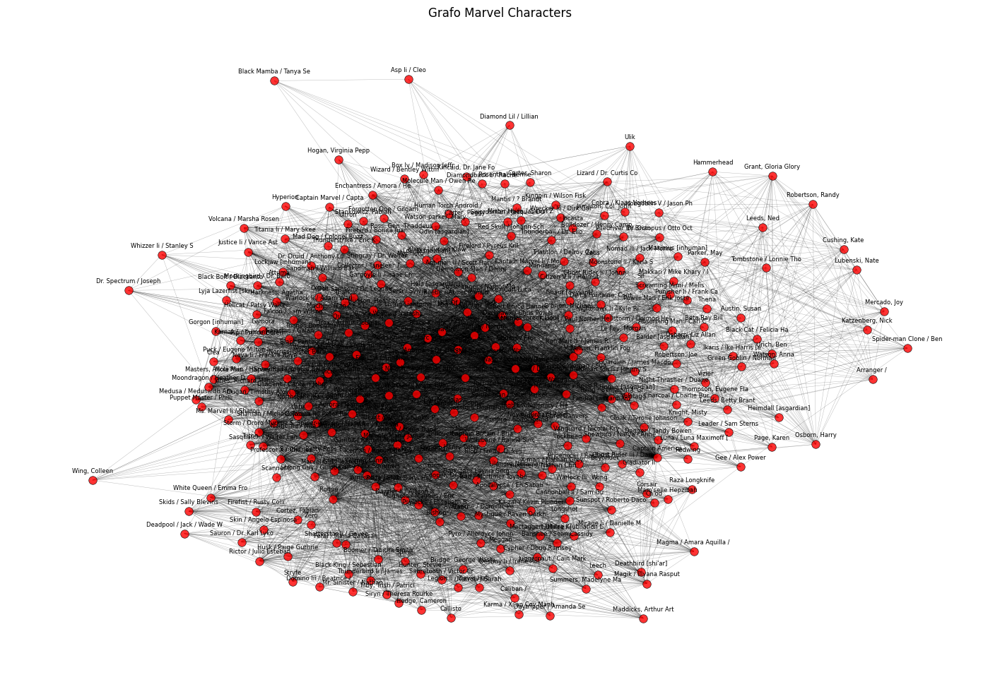

In [3]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# =======================
# 2. CREAZIONE DEL GRAFO
# =======================
G = nx.Graph()     # Usa nx.DiGraph() se il grafo è orientato

# Aggiungi nodi con attributi (se ci sono)
for _, row in nodes_df.iterrows():
    node_id = row["Id"]
    attrs = row.to_dict()
    G.add_node(node_id, **attrs)

# Aggiungi archi
for _, row in edges_df.iterrows():
    G.add_edge(row["Source"], row["Target"], weight=row.get("Weight", 1))

# =======================
# 3. LAYOUT (POSIZIONAMENTO)
# =======================
pos = nx.spring_layout(G, seed=42)  # layout force-directed

# =======================
# 4. DISEGNO DEL GRAFO
# =======================
plt.figure(figsize=(18, 12))

# 1. Layout più leggibile
pos = nx.kamada_kawai_layout(G)

# 2. Disegno nodi
nx.draw_networkx_nodes(
    G, pos,
    node_size=70,
    node_color="red",
    alpha=0.8,
    edgecolors="black",
    linewidths=0.5
)

# 3. Disegno archi
nx.draw_networkx_edges(
    G, pos,
    alpha=0.3,        # molto più leggero
    width=0.3
)

# 4. Label spostate con offset verticale
labels = {n: G.nodes[n].get("label", n) for n in G.nodes()}
label_pos = {n: (x, y + 0.03) for n, (x, y) in pos.items()}

nx.draw_networkx_labels(
    G, label_pos,
    labels,
    font_size=6
)

plt.title("Grafo Marvel Characters")
plt.axis("off")
plt.show()

In [4]:
from pyvis.network import Network
import pandas as pd

net = Network(height="900px", width="100%", notebook=False, bgcolor="#222222", font_color="white")

# Trasforma il grafo NetworkX → PyVis
net.from_nx(G)

# Usa la fisica per separare i nodi
net.force_atlas_2based()

# Salva e visualizza
net.show("grafo_interattivo.html",notebook=False)


grafo_interattivo.html


In [5]:
# 1. Calculate the quartiles (quantiles) of the 'Weight' column
# We use pd.qcut to discretize based on quantiles, which ensures equal number of edges in each bin.
# We set the number of bins (q) to 4.
try:
    # Use qcut to discretize based on quantiles
    # labels=False returns integer codes for the bins (0, 1, 2, 3)
    edges_df['Weight_Bin'] = pd.qcut(edges_df['Weight'], q=4, labels=False, duplicates='drop')

    # 2. Define the categorical labels based on the quantile bins
    # Note: pd.qcut returns labels starting from 0.
    labels_map = {
        0: "Interazione Debole",
        1: "Interazione Media-Bassa",
        2: "Interazione Media-Alta",
        3: "Interazione Forte"
    }

    # Map the integer codes to the descriptive labels
    edges_df['Interaction_Strength'] = edges_df['Weight_Bin'].map(labels_map)
    
    # Calculate the actual weight ranges for the quartiles (for display)
    # We use cut to get the bins based on the previously calculated quantiles
    # This helps in knowing the actual weight value boundaries.
    weight_cut_info = pd.cut(edges_df['Weight'], bins=edges_df['Weight'].quantile([0, 0.25, 0.5, 0.75, 1.0]), include_lowest=True, duplicates='drop')
    
    # Get the unique categories and their corresponding intervals
    intervals = weight_cut_info.unique().categories
    
    # Create a summary DataFrame for the intervals
    interval_summary = pd.DataFrame({
        'Label': list(labels_map.values()),
        'Weight Range (W)': [str(i) for i in intervals]
    })
    
    print("--- Riassunto degli Intervalli di Peso ---")
    print(interval_summary.to_string(index=False))

    print("\n--- Prime 10 righe del DataFrame con Intervalli ---")
    print(edges_df[['Source', 'Target', 'Weight', 'Interaction_Strength']].head(10).to_string())

    # Save the new DataFrame with the discretized column
    edges_df.to_csv('marvel-unimodal-edges-discretized.csv', index=False)
    print("\nSaved the new discretized edge data to 'marvel-unimodal-edges-discretized.csv'.")

except ValueError as e:
    print(f"Error during qcut: {e}")
    print("This usually means there are too many duplicate values at the quantile boundaries. Checking value counts...")
    print(edges_df['Weight'].value_counts().sort_index().head(20))
    # If duplicates='drop' didn't fix it, there's a serious issue with the distribution.
    # For now, we rely on 'duplicates=drop' which should handle it.

--- Riassunto degli Intervalli di Peso ---
                  Label Weight Range (W)
     Interazione Debole     (4.999, 7.0]
Interazione Media-Bassa      (7.0, 11.0]
 Interazione Media-Alta     (11.0, 21.0]
      Interazione Forte    (21.0, 744.0]

--- Prime 10 righe del DataFrame con Intervalli ---
                   Source                   Target  Weight     Interaction_Strength
0  Black Panther / T'chal         Loki [asgardian]      10  Interazione Media-Bassa
1  Black Panther / T'chal        Mantis / ? Brandt      23        Interazione Forte
2  Black Panther / T'chal    Iceman / Robert Bobby      12   Interazione Media-Alta
3  Black Panther / T'chal  Marvel Girl / Jean Grey      10  Interazione Media-Bassa
4  Black Panther / T'chal   Cyclops / Scott Summer      14   Interazione Media-Alta
5  Black Panther / T'chal      Klaw / Ulysses Klaw      17   Interazione Media-Alta
6  Black Panther / T'chal   Human Torch / Johnny S      44        Interazione Forte
7  Black Panther / T'chal  

In [6]:
# 1. Calculate the quantiles for the 'Weight' column
# Use q=[0, 0.25, 0.5, 0.75, 1.0] to get the five boundaries for four intervals.
quantiles = edges_df['Weight'].quantile([0, 0.25, 0.5, 0.75, 1.0]).tolist()

# Ensure the bins start at the true minimum and end at the true maximum
bins = [quantiles[0] - 1e-6] + quantiles[1:-1] + [quantiles[-1]]

# 2. Define the labels
labels = [
    "Interazione Debole",
    "Interazione Media-Bassa",
    "Interazione Media-Alta",
    "Interazione Forte"
]

# 3. Discretize the 'Weight' column using the quantiles
edges_df['Interaction_Category'] = pd.cut(
    edges_df['Weight'],
    bins=bins,
    labels=labels,
    include_lowest=True,
    right=True
)

# 4. Show the results
print("Punti di Taglio (Quantili) per la Discretizzazione:")
print(f"Q0 (Min): {quantiles[0]}")
print(f"Q1 (25%): {quantiles[1]}")
print(f"Q2 (50%): {quantiles[2]}")
print(f"Q3 (75%): {quantiles[3]}")
print(f"Q4 (Max): {quantiles[4]}")

print("\nConteggio degli Archi per Nuova Categoria:")
print(edges_df['Interaction_Category'].value_counts().sort_index())

print("\nPrime 10 righe del DataFrame con la nuova colonna di categoria:")
print(edges_df.head(10))

# 5. Save the new DataFrame to a CSV file
edges_df.to_csv('marvel-unimodal-edges_discretized.csv', index=False)
print("\nDataFrame aggiornato salvato come 'marvel-unimodal-edges_discretized.csv'.")

Punti di Taglio (Quantili) per la Discretizzazione:
Q0 (Min): 5.0
Q1 (25%): 7.0
Q2 (50%): 11.0
Q3 (75%): 21.0
Q4 (Max): 744.0

Conteggio degli Archi per Nuova Categoria:
Interaction_Category
Interazione Debole         3212
Interazione Media-Bassa    2154
Interazione Media-Alta     2164
Interazione Forte          2361
Name: count, dtype: int64

Prime 10 righe del DataFrame con la nuova colonna di categoria:
                   Source                   Target  Weight  Weight_Bin  \
0  Black Panther / T'chal         Loki [asgardian]      10           1   
1  Black Panther / T'chal        Mantis / ? Brandt      23           3   
2  Black Panther / T'chal    Iceman / Robert Bobby      12           2   
3  Black Panther / T'chal  Marvel Girl / Jean Grey      10           1   
4  Black Panther / T'chal   Cyclops / Scott Summer      14           2   
5  Black Panther / T'chal      Klaw / Ulysses Klaw      17           2   
6  Black Panther / T'chal   Human Torch / Johnny S      44           3  

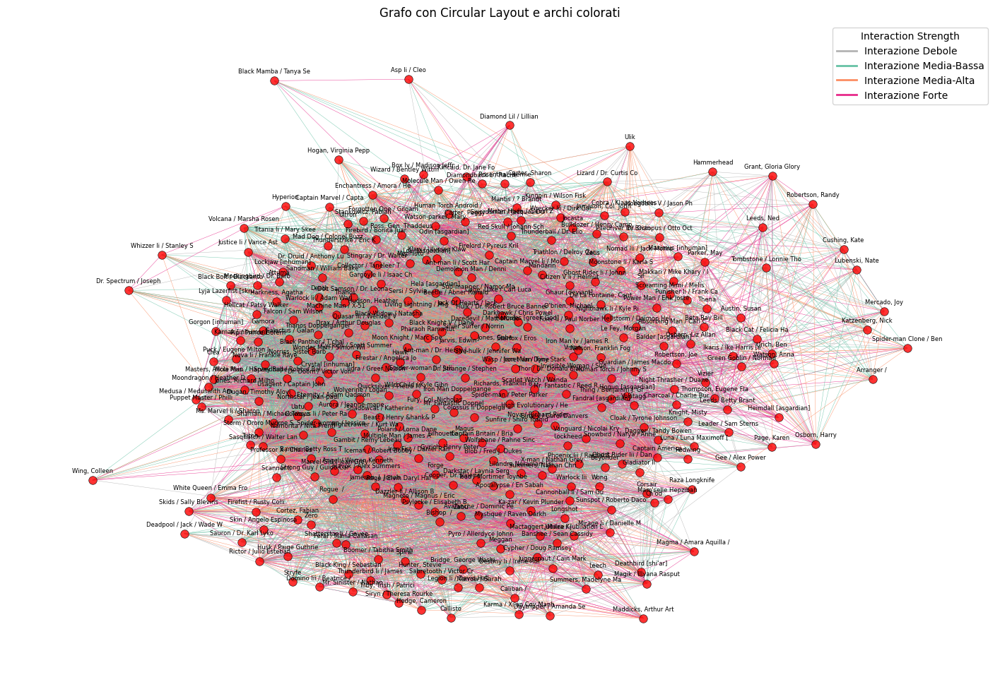

In [7]:
from matplotlib.lines import Line2D
# 1. Definizione della mappa colori per le categorie di interazione
color_map = {
    "Interazione Debole": '#b3b3b3',        # Grigio Chiaro
    "Interazione Media-Bassa": '#66c2a5',   # Verde/Teal
    "Interazione Media-Alta": '#fc8d62',    # Arancione
    "Interazione Forte": '#e7298a'          # Magenta/Pink
}

# Aggiungi nodi con attributi (se ci sono)
for _, row in nodes_df.iterrows():
    node_id = row["Id"]
    attrs = row.to_dict()
    G.add_node(node_id, **attrs)

# Aggiungi archi
for _, row in edges_df.iterrows():
    G.add_edge(row["Source"], 
    row["Target"], 
    Interaction_Strength=row.get("Interaction_Strength"), 
    weight=row.get("Weight", 1)
    )

edge_colors = [
    color_map.get(G[u][v].get('Interaction_Strength', ''), '#000000')
    for u, v in G.edges()
]


# =======================
# 3. LAYOUT (POSIZIONAMENTO)
# =======================
pos = nx.spring_layout(G, seed=42)  # layout force-directed

# =======================
# 4. DISEGNO DEL GRAFO
# =======================
plt.figure(figsize=(18, 12))

# 1. Layout più leggibile
pos = nx.kamada_kawai_layout(G)

# 2. Disegno nodi
nx.draw_networkx_nodes(
    G, pos,
    node_size=70,
    node_color="red",
    alpha=0.8,
    edgecolors="black",
    linewidths=0.5
)

# 3. Disegno archi
nx.draw_networkx_edges(
    G, pos,
    width=0.3,
    edge_color=edge_colors
)

# 4. Label spostate con offset verticale
labels = {n: G.nodes[n].get("label", n) for n in G.nodes()}
label_pos = {n: (x, y + 0.03) for n, (x, y) in pos.items()}

nx.draw_networkx_labels(
    G, label_pos,
    labels,
    font_size=6
)

# =======================
# 6. LEGENDA
# =======================
legend_elements = [Line2D([0], [0], color=color_map[key], lw=2, label=key)
                   for key in color_map]
plt.legend(handles=legend_elements, title="Interaction Strength", loc='upper right')

plt.title("Grafo con Circular Layout e archi colorati")
plt.axis("off")
plt.show()

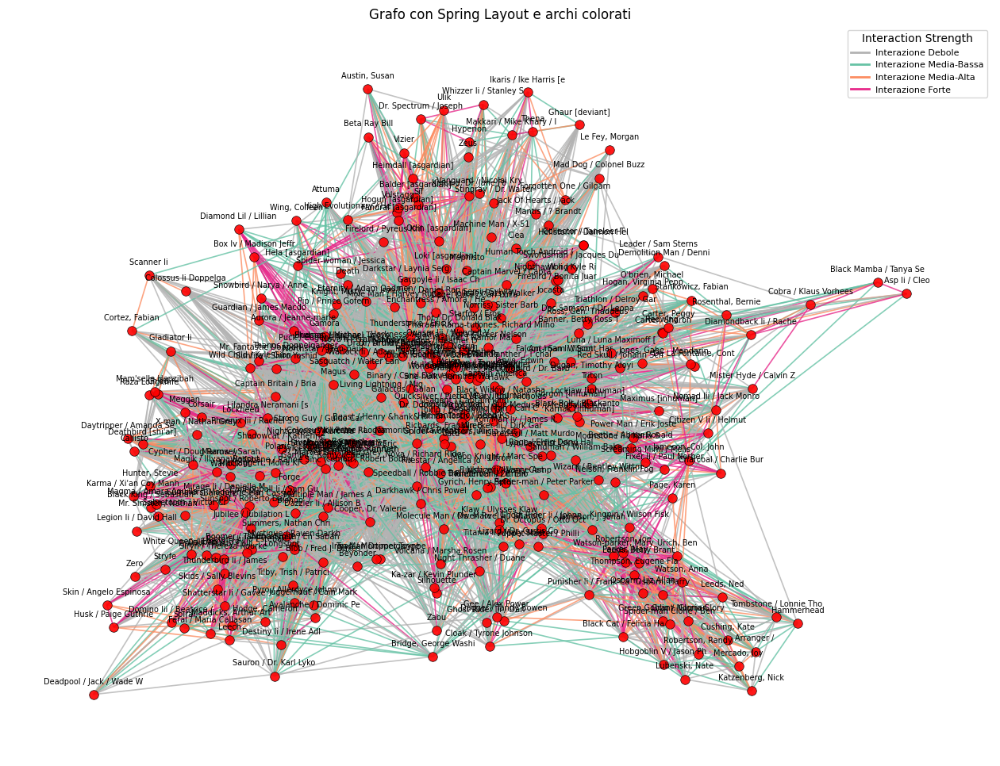

In [8]:
# =======================
# 1. CREAZIONE DEL GRAFO
# =======================
G = nx.Graph()

# Aggiungi nodi
for _, row in nodes_df.iterrows():
    G.add_node(row["Id"], **row.to_dict())

# Aggiungi archi con Interaction_Strength
for _, row in edges_df.iterrows():
    G.add_edge(
        row["Source"],
        row["Target"],
        weight=row.get("Weight", 1),
        Interaction_Strength=row.get("Interaction_Strength")
    )

# =======================
# 2. LAYOUT SPRING
# =======================
pos = nx.spring_layout(G, seed=42)   # <- Layout richiesto

# =======================
# 3. COLORI ARCHI
# =======================
color_map = {
    "Interazione Debole": '#b3b3b3',        # Grigio Chiaro
    "Interazione Media-Bassa": '#66c2a5',   # Verde/Teal
    "Interazione Media-Alta": '#fc8d62',    # Arancione
    "Interazione Forte": '#e7298a'          # Magenta/Pink
}

edge_colors = [
    color_map.get(G[u][v].get('Interaction_Strength', ''), '#000000')
    for u, v in G.edges()
]

# =======================
# 4. DISEGNO GRAFO
# =======================
plt.figure(figsize=(16, 12))

# Nodi
nx.draw_networkx_nodes(
    G, pos,
    node_size=70,
    node_color="red",
    alpha=0.9,
    edgecolors="black",
    linewidths=0.5
)

# Archi colorati
nx.draw_networkx_edges(
    G, pos,
    edge_color=edge_colors,
    width=1.2,
    alpha=0.8
)

# Etichette
labels = {n: G.nodes[n].get("label", n) for n in G.nodes()}
label_pos = {n: (x, y + 0.03) for n, (x, y) in pos.items()}
nx.draw_networkx_labels(G, label_pos, labels, font_size=7)

# =======================
# 5. LEGENDA
# =======================
legend_elements = [
    Line2D([0], [0], color=color_map[key], lw=2, label=key)
    for key in color_map
]

plt.legend(
    handles=legend_elements,
    title="Interaction Strength",
    loc='upper right',
    fontsize=8
)

plt.title("Grafo con Spring Layout e archi colorati")
plt.axis("off")
plt.show()


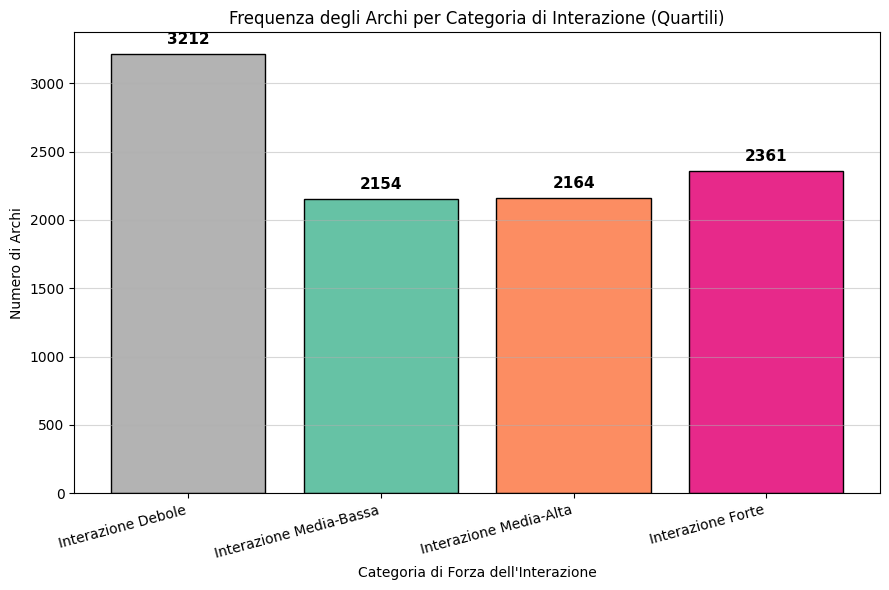

In [9]:
category_order = ["Interazione Debole", "Interazione Media-Bassa", "Interazione Media-Alta", "Interazione Forte"]

# Raggruppa e conta le 4 categorie
counts = edges_df['Interaction_Category'].value_counts().reindex(category_order).reset_index()
counts.columns = ["Category", "Count"]

# Mappa i colori per il plot
colors = [color_map.get(cat, "gray") for cat in counts["Category"]]

# Plot
plt.figure(figsize=(9, 6))
bars = plt.bar(counts["Category"], counts["Count"], color=colors, edgecolor="black")

# Aggiungi i numeri sopra ogni barra
for bar in bars:
    y = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, y + 50, str(int(y)),
             ha="center", va="bottom", fontsize=11, fontweight='bold')

plt.title("Frequenza degli Archi per Categoria di Interazione (Quartili)")
plt.xlabel("Categoria di Forza dell'Interazione")
plt.ylabel("Numero di Archi")
plt.xticks(rotation=15, ha="right")
plt.grid(axis='y', alpha=0.5)
plt.tight_layout()
plt.savefig('distribution_of_interaction_categories.png')
plt.show()

In [10]:
# --- 1. Calculate Centrality Metrics ---

# a) Unweighted Degree Centrality (simple number of connections)
degree_centrality = nx.degree_centrality(G)

# --- 2. Combine results into a DataFrame ---

# Start with the nodes list
centrality_df = nodes_df[['Id']].copy()
centrality_df.rename(columns={'Id': 'Character'}, inplace=True)

centrality_df2= nodes_df[['Id']].copy()
centrality_df2.rename(columns={'Id': 'Character'}, inplace=True)

centrality_df3 = nodes_df[['Id']].copy()
centrality_df3.rename(columns={'Id': 'Character'}, inplace=True)

centrality_df4 = nodes_df[['Id']].copy()
centrality_df4.rename(columns={'Id': 'Character'}, inplace=True)

# Add all calculated metrics
centrality_df['Degree_Centrality'] = centrality_df['Character'].map(degree_centrality)

# --- 3. Display and Save Top 10 by Weighted Degree ---

# Sort by the most informative metric (Degree Centrality)
top_10_centrality = centrality_df.sort_values(by='Degree_Centrality', ascending=False).head(10)
bottom_10_centrality = centrality_df.sort_values(by='Degree_Centrality', ascending=True).head(10)


print("Risultati del Calcolo di tutte le Centralità:")
print("\nTop 10 Personaggi per Grado di Centralità:")
print(top_10_centrality.to_string(index=False))
print("\n ---------------------- \n \nBottom 10 Personaggi per Grado di Centralità:")
print(bottom_10_centrality.to_string(index=False))



Risultati del Calcolo di tutte le Centralità:

Top 10 Personaggi per Grado di Centralità:
                Character  Degree_Centrality
          Captain America           0.791411
        Wolverine / Logan           0.674847
Spider-man / Peter Parker           0.668712
   Thing / Benjamin J. Gr           0.656442
                   Vision           0.653374
   Beast / Henry &hank& P           0.628834
   Thor / Dr. Donald Blak           0.628834
    Iron Man / Tony Stark           0.622699
   Mr. Fantastic / Reed R           0.607362
   Cyclops / Scott Summer           0.604294

 ---------------------- 
 
Bottom 10 Personaggi per Grado di Centralità:
               Character  Degree_Centrality
           Asp Ii / Cleo           0.024540
  Black Mamba / Tanya Se           0.024540
           Wing, Colleen           0.036810
Deadpool / Jack / Wade W           0.039877
  Skin / Angelo Espinosa           0.042945
   Diamond Lil / Lillian           0.042945
   Dr. Spectrum / Joseph         

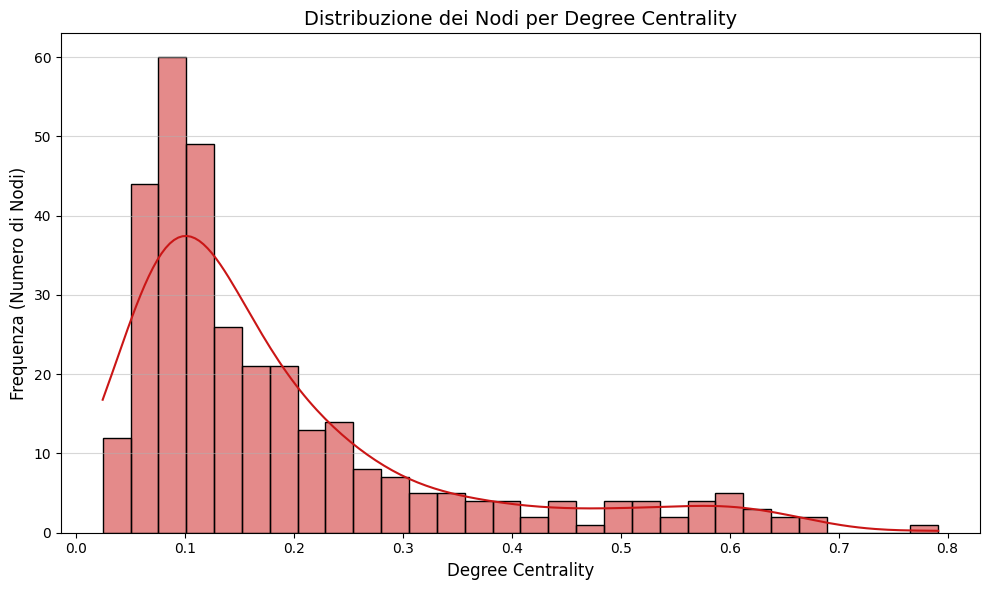

In [11]:
# Calculate Degree Centrality
degree_values = list(degree_centrality.values())

# Create the plot
plt.figure(figsize=(10, 6))
# Using 30 bins for a detailed view of the distribution shape
sns.histplot(degree_values, bins=30, color="#ca1616",kde = True)

# Add a title and labels
plt.title('Distribuzione dei Nodi per Degree Centrality', fontsize=14)
plt.xlabel('Degree Centrality', fontsize=12)
plt.ylabel('Frequenza (Numero di Nodi)', fontsize=12)
plt.grid(axis='y', alpha=0.5)

# Save the plot
plt.tight_layout()
plt.show()

Interpretazione del GraficoConcentrazione Bassa (Periferia): 
1. La maggior parte dei nodi (personaggi) si concentra nell'intervallo di bassa centralità (intorno a 0.05 - 0.20). Questi sono i personaggi con un numero relativamente basso di connessioni uniche; formano la periferia della rete.

2. Lunga Coda (Hubs): Il grafico presenta una coda lunga che si estende verso l'alto, arrivando fino al massimo (circa 0.79). Questi valori più alti rappresentano un numero molto piccolo di nodi (gli Hubs), che sono i personaggi estremamente connessi (come Captain America e Wolverine).

3. Rete Scale-Free (Senza Scala) o Small-World: Questa forma di distribuzione (molti nodi piccoli e pochi nodi giganteschi) è tipica delle reti del Mondo Piccolo (Small-World) o Scale-Free (Senza Scala), come i social network, Internet e le reti biologiche. In pratica, la rete è dominata da pochi personaggi chiave che fungono da centri di connessione.

4. Media: La linea rossa indica che la media del Grado di Centralità è molto bassa ($\approx 0.15$), confermando che la stragrande maggioranza dei personaggi ha un ruolo marginale, mentre l'attività è centralizzata in pochissimi hub.

In [14]:
# c) Betweenness Centrality
# Measures the proportion of shortest paths that pass through a node.
# Due to the large number of paths, this is calculated without weights for speed and standard comparison.
for u, v, data in G.edges(data=True):
    w = data['Weight']
    data['distance'] = 1 / w     # distanza inversamente proporzionale al numero di interazioni
    
betweenness_centrality = nx.betweenness_centrality(G, weight='distance')

centrality_df2['Betweenness_Centrality'] = centrality_df2['Character'].map(betweenness_centrality)

# --- 3. Display and Save Top 10 by Weighted Degree ---

# Sort by the most informative metric (Degree Centrality)
top_10_centrality = centrality_df2.sort_values(by='Betweenness_Centrality', ascending=False).head(10)
bottom_10_centrality = centrality_df2.sort_values(by='Betweenness_Centrality', ascending=True).head(10)


print("Risultati del Calcolo di tutte le Centralità:")
print("\nTop 10 Personaggi per Betweenness Centrality:")
print(top_10_centrality.to_string(index=False))
print("\n ---------------------- \n \nBottom 10 Personaggi per B:")
print(bottom_10_centrality.to_string(index=False))

Risultati del Calcolo di tutte le Centralità:

Top 10 Personaggi per Betweenness Centrality:
                     Character  Betweenness_Centrality
               Captain America                0.531721
        Beast / Henry &hank& P                0.292841
     Spider-man / Peter Parker                0.200019
             Wolverine / Logan                0.186184
        Cyclops / Scott Summer                0.157628
        Thor / Dr. Donald Blak                0.121057
        Thing / Benjamin J. Gr                0.108350
Hulk / Dr. Robert Bruce Banner                0.066748
        Cannonball Ii / Sam Gu                0.058575
         Iron Man / Tony Stark                0.055177

 ---------------------- 
 
Bottom 10 Personaggi per B:
             Character  Betweenness_Centrality
Screaming Mimi / Melis                     0.0
    Stankowicz, Fabian                     0.0
Swordsman / Jacques Du                     0.0
      O'brien, Michael                     0.0
Diamondback

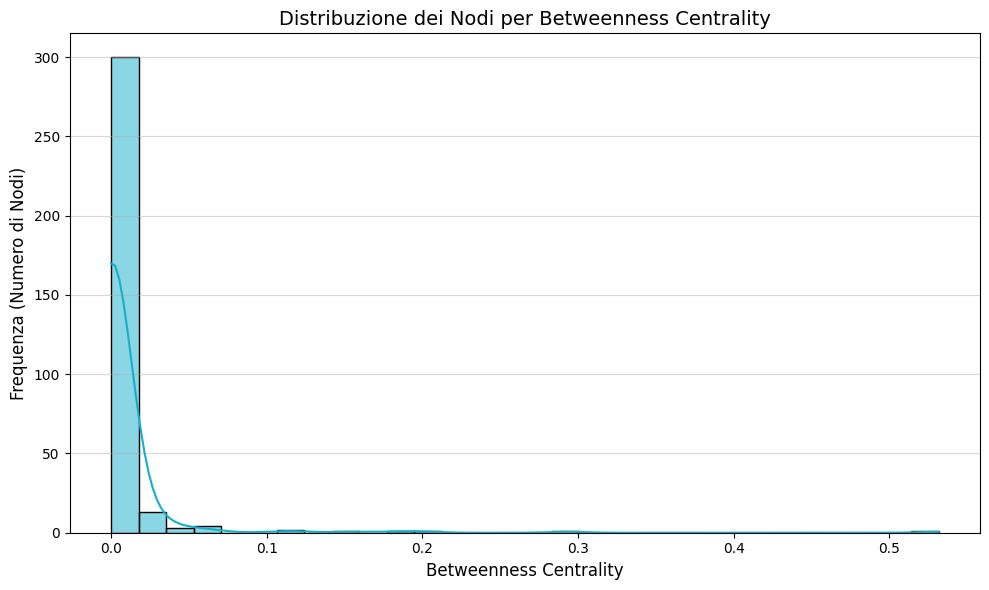

In [15]:
# Calculate Betweenness Centrality
betweness_values = list(betweenness_centrality.values())

# Create the plot
plt.figure(figsize=(10, 6))
# Using 30 bins for a detailed view of the distribution shape
sns.histplot(betweness_values, bins=30, color="#16afca", edgecolor='black', kde = True)

# Add a title and labels
plt.title('Distribuzione dei Nodi per Betweenness Centrality', fontsize=14)
plt.xlabel('Betweenness Centrality', fontsize=12)
plt.ylabel('Frequenza (Numero di Nodi)', fontsize=12)
plt.grid(axis='y', alpha=0.5)

# Save the plot
plt.tight_layout()
plt.show()

In [16]:

# d) Closeness Centrality
# Measures how quickly a node can reach all other nodes in the network.
# Calculated using inverse of the sum of shortest distances.
# We will use the unweighted graph for a simpler distance measure (number of steps).
closeness_centrality = nx.closeness_centrality(G)

centrality_df3['Closeness_Centrality'] = centrality_df3['Character'].map(closeness_centrality)

# --- 3. Display and Save Top 10 by Weighted Degree ---

# Sort by the most informative metric (Degree Centrality)
top_10_centrality = centrality_df3.sort_values(by='Closeness_Centrality', ascending=False).head(10)
bottom_10_centrality = centrality_df3.sort_values(by='Closeness_Centrality', ascending=True).head(10)


print("Risultati del Calcolo di tutte le Centralità:")
print("\nTop 10 Personaggi per Closeness Centrality:")
print(top_10_centrality.to_string(index=False))
print("\n ---------------------- \n \nBottom 10 Personaggi per Closeness Centrality:")
print(bottom_10_centrality.to_string(index=False))

Risultati del Calcolo di tutte le Centralità:

Top 10 Personaggi per Closeness Centrality:
                Character  Closeness_Centrality
          Captain America              0.827411
        Wolverine / Logan              0.754630
Spider-man / Peter Parker              0.751152
   Thing / Benjamin J. Gr              0.744292
                   Vision              0.742597
   Thor / Dr. Donald Blak              0.729306
   Beast / Henry &hank& P              0.729306
    Iron Man / Tony Stark              0.726058
   Mr. Fantastic / Reed R              0.718062
   Cyclops / Scott Summer              0.716484

 ---------------------- 
 
Bottom 10 Personaggi per Closeness Centrality:
               Character  Closeness_Centrality
Deadpool / Jack / Wade W              0.401478
          Lubenski, Nate              0.441734
            Mercado, Joy              0.442935
        Katzenberg, Nick              0.442935
        Robertson, Randy              0.443537
           Cushing, Kate

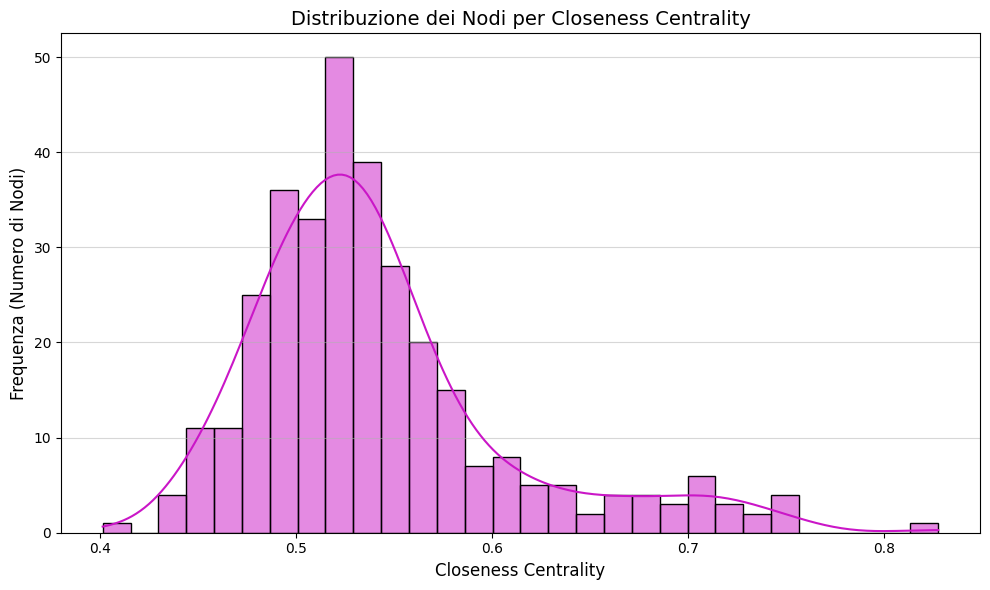

In [17]:
# Calculate Closeness Centrality
closeness_values = list(closeness_centrality.values())

# Create the plot
plt.figure(figsize=(10, 6))
# Using 30 bins for a detailed view of the distribution shape
sns.histplot(closeness_values, bins=30, color="#ca16c7", edgecolor='black',kde = True)

# Add a title and labels
plt.title('Distribuzione dei Nodi per Closeness Centrality', fontsize=14)
plt.xlabel('Closeness Centrality', fontsize=12)
plt.ylabel('Frequenza (Numero di Nodi)', fontsize=12)
plt.grid(axis='y', alpha=0.5)

# Save the plot
plt.tight_layout()
plt.show()

In [18]:
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000, tol=1e-06)

centrality_df4['Eigenvector_Centrality'] = centrality_df4['Character'].map(eigenvector_centrality)

# --- 3. Display and Save Top 10 by Weighted Degree ---

# Sort by the most informative metric (Degree Centrality)
top_10_centrality = centrality_df4.sort_values(by='Eigenvector_Centrality', ascending=False).head(10)
bottom_10_centrality = centrality_df4.sort_values(by='Eigenvector_Centrality', ascending=True).head(10)


print("Risultati del Calcolo di tutte le Centralità:")
print("\nTop 10 Personaggi per Eigenvector Centrality:")
print(top_10_centrality.to_string(index=False))
print("\n ---------------------- \n \nBottom 10 Personaggi per Eigenvector Centrality:")
print(bottom_10_centrality.to_string(index=False))

Risultati del Calcolo di tutte le Centralità:

Top 10 Personaggi per Eigenvector Centrality:
                Character  Eigenvector_Centrality
          Captain America                0.139418
        Wolverine / Logan                0.131218
   Thing / Benjamin J. Gr                0.129755
                   Vision                0.127247
   Beast / Henry &hank& P                0.126039
Spider-man / Peter Parker                0.123751
   Human Torch / Johnny S                0.123180
    Invisible Woman / Sue                0.123150
   Cyclops / Scott Summer                0.123089
    Scarlet Witch / Wanda                0.122284

 ---------------------- 
 
Bottom 10 Personaggi per Eigenvector Centrality:
               Character  Eigenvector_Centrality
           Asp Ii / Cleo                0.003236
  Black Mamba / Tanya Se                0.003236
        Katzenberg, Nick                0.004394
            Mercado, Joy                0.004586
Deadpool / Jack / Wade W           

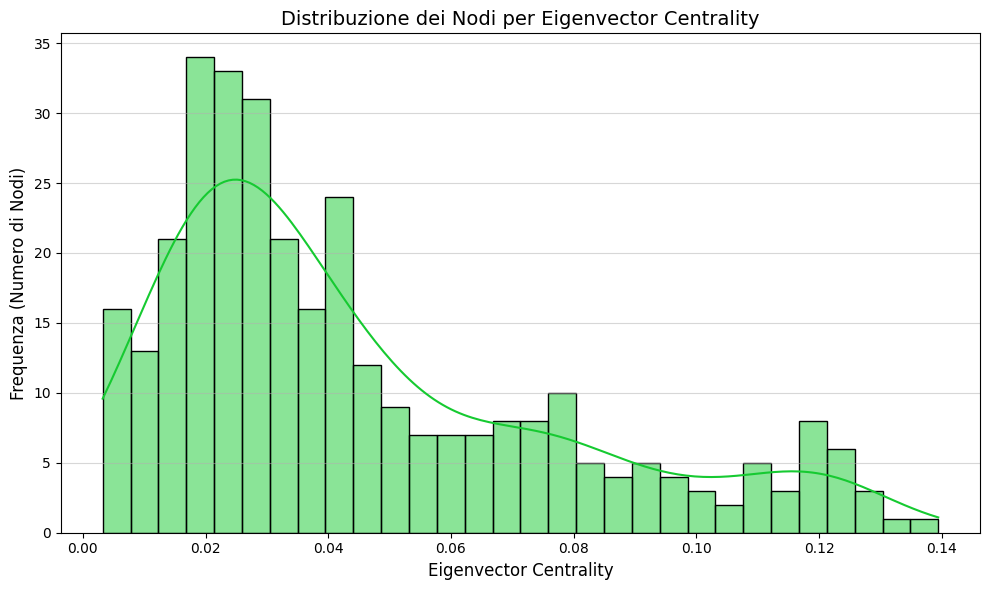

In [19]:
# Calculate Eigenvector Centrality
eigenvector_values = list(eigenvector_centrality.values())

# Create the plot
plt.figure(figsize=(10, 6))
# Using 30 bins for a detailed view of the distribution shape
sns.histplot(eigenvector_values, bins=30, color="#16ca31", edgecolor='black',kde = True)

# Add a title and labels
plt.title('Distribuzione dei Nodi per Eigenvector Centrality', fontsize=14)
plt.xlabel('Eigenvector Centrality', fontsize=12)
plt.ylabel('Frequenza (Numero di Nodi)', fontsize=12)
plt.grid(axis='y', alpha=0.5)

# Save the plot
plt.tight_layout()
plt.show()

In [20]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors

def plot_centrality_color(G, pos, centrality_dict, title):
    fig, ax = plt.subplots(figsize=(8, 6))

    # Convert centrality values to array
    values = np.array(list(centrality_dict.values()))

    # Create normalization range
    norm = mcolors.Normalize(vmin=values.min(), vmax=values.max())
    cmap = cm.viridis

    # Map each node's centrality to a color
    node_colors = [cmap(norm(centrality_dict[n])) for n in G.nodes()]

    # Draw edges
    nx.draw_networkx_edges(
        G, pos,
        edge_color='gray',
        alpha=0.25,
        width=0.6,
        ax=ax     
    )

    # Draw nodes
    nx.draw_networkx_nodes(
        G, pos,
        node_size=80,
        node_color=node_colors,
        alpha=0.95,
        ax=ax      
    )

    # Colorbar
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([]) 
    fig.colorbar(sm, ax=ax, label="Centralità")  

    ax.set_title(title, fontsize=16)
    ax.set_axis_off()

    plt.tight_layout()
    plt.show()
    plt.close()
    


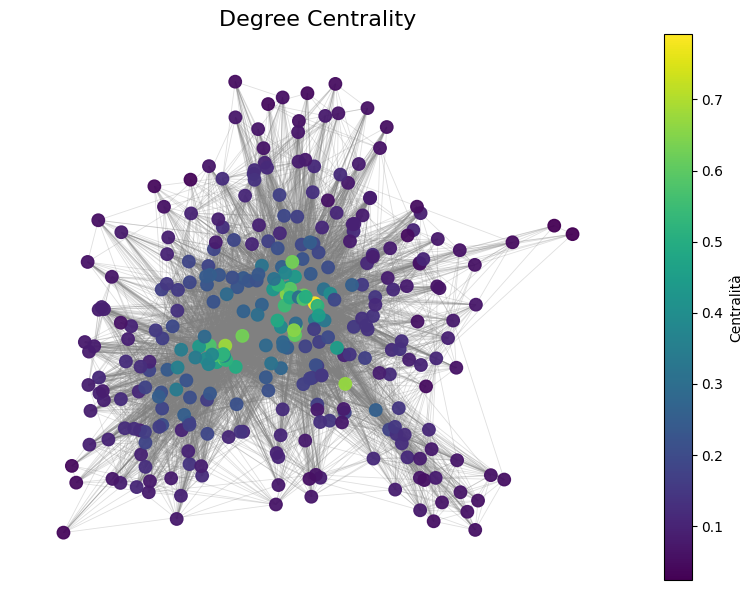

In [21]:

plot_centrality_color(
    G, pos,
    degree_centrality,
    'Degree Centrality'
)



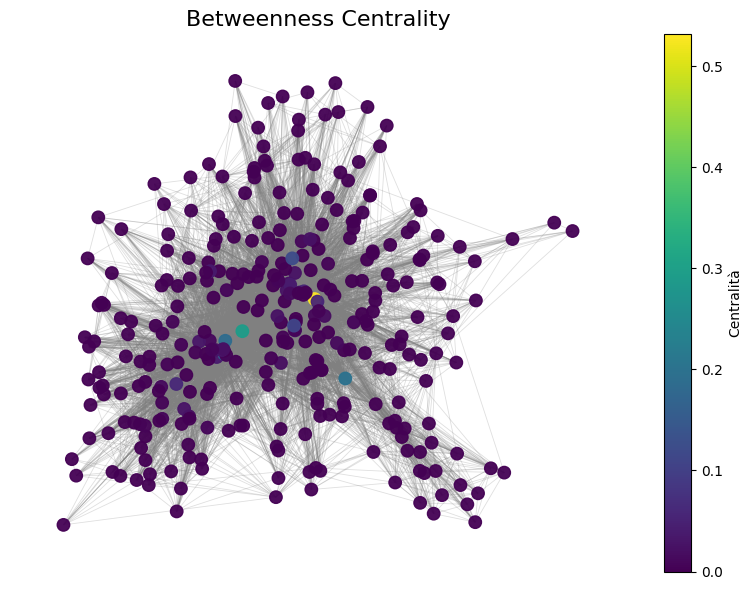

In [22]:
plot_centrality_color(
    G, pos,
    betweenness_centrality,
    'Betweenness Centrality'
)

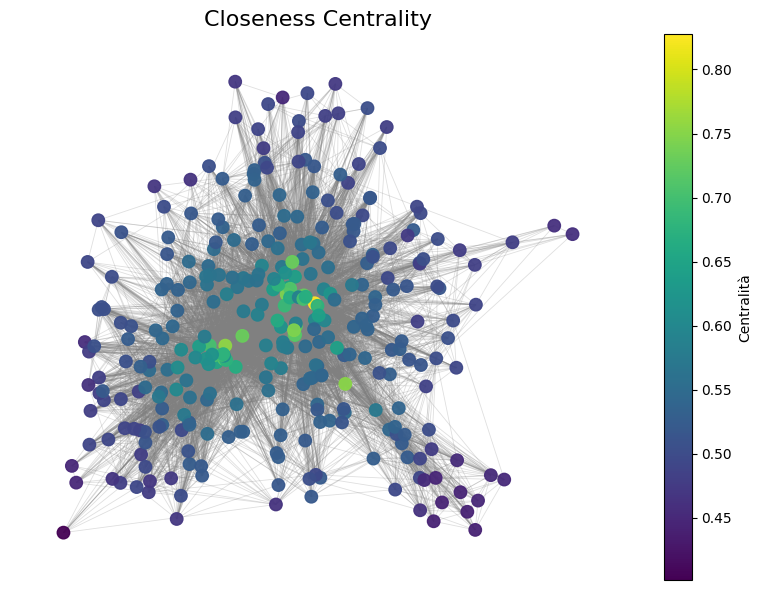

In [23]:
plot_centrality_color(
    G, pos,
    closeness_centrality,
    'Closeness Centrality'
)   

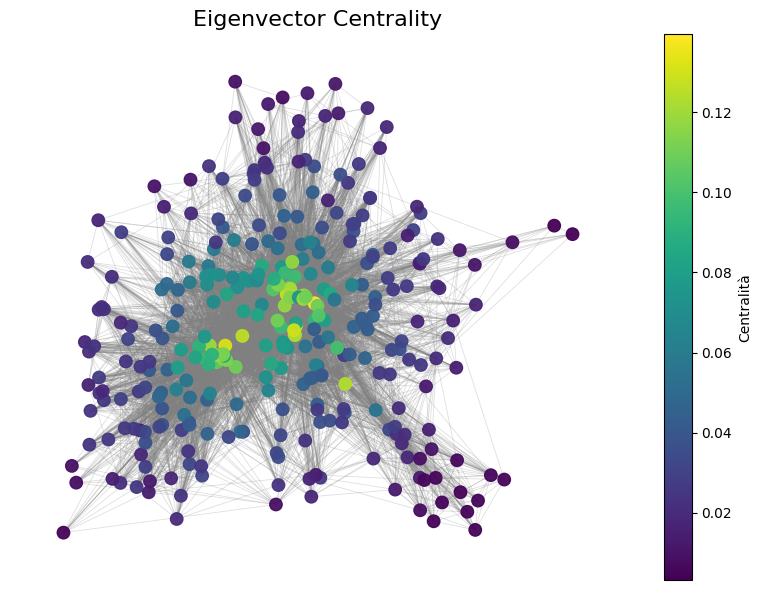

In [24]:
plot_centrality_color(
    G, pos,
    eigenvector_centrality,
    'Eigenvector Centrality'
)

In [25]:
# --- 1. Triads (Triangles) ---
triangles = sum(nx.triangles(G).values()) // 3
print(f"Numero Totale di Triadi (Triangoli) nel Grafo: {triangles}")

# --- Extract triads with weights ---
triads_dict = {}   # key = sorted nodes → value = triad data

for u in G.nodes():
    neighbors = list(G.neighbors(u))
    for i in range(len(neighbors)):
        for j in range(i + 1, len(neighbors)):
            v = neighbors[i]
            w = neighbors[j]

            if G.has_edge(v, w):

                # Normalizza la triade (per evitare duplicati)
                triad_key = tuple(sorted([u, v, w]))

                # Calcola pesi dei 3 archi
                w_uv = G[u][v].get("weight", 1)
                w_uw = G[u][w].get("weight", 1)
                w_vw = G[v][w].get("weight", 1)

                total_weight = w_uv + w_uw + w_vw

                # Aggiungi solo se non esiste già
                if triad_key not in triads_dict:
                    triads_dict[triad_key] = {
                        "nodes": triad_key,
                        "weights": (w_uv, w_uw, w_vw),
                        "weight_sum": total_weight
                    }

# Converti in lista
triads = list(triads_dict.values())


# --- Ordina triadi per peso totale (decrescente) ---
triads_heaviest = sorted(triads, key=lambda x: x["weight_sum"], reverse=True)

print("\n🔝 Triadi più pesanti:")
for t in triads_heaviest[:10]:
    print(f"Triade: {t['nodes']}  |  Pesi: {t['weights']}  |  Peso totale: {t['weight_sum']}")



Numero Totale di Triadi (Triangoli) nel Grafo: 155834

🔝 Triadi più pesanti:
Triade: ("Black Panther / T'chal", 'Loki [asgardian]', 'Mantis / ? Brandt')  |  Pesi: (1, 1, 1)  |  Peso totale: 3
Triade: ("Black Panther / T'chal", 'Cyclops / Scott Summer', 'Loki [asgardian]')  |  Pesi: (1, 1, 1)  |  Peso totale: 3
Triade: ("Black Panther / T'chal", 'Human Torch / Johnny S', 'Loki [asgardian]')  |  Pesi: (1, 1, 1)  |  Peso totale: 3
Triade: ("Black Panther / T'chal", 'Loki [asgardian]', 'Mr. Fantastic / Reed R')  |  Pesi: (1, 1, 1)  |  Peso totale: 3
Triade: ("Black Panther / T'chal", 'Dr. Strange / Stephen', 'Loki [asgardian]')  |  Pesi: (1, 1, 1)  |  Peso totale: 3
Triade: ("Black Panther / T'chal", 'Loki [asgardian]', 'Mephisto')  |  Pesi: (1, 1, 1)  |  Peso totale: 3
Triade: ("Black Panther / T'chal", 'Loki [asgardian]', 'Swordsman / Jacques Du')  |  Pesi: (1, 1, 1)  |  Peso totale: 3
Triade: ("Black Panther / T'chal", 'Loki [asgardian]', 'Sub-mariner / Namor Ma')  |  Pesi: (1, 1, 1)  |

In [26]:
# --- 2. Clique ---

# Trova tutte le clique
all_cliques = list(nx.find_cliques(G))   # ogni clique è una lista di nodi

print(f"Numero totale di clique trovate: {len(all_cliques)}")

cliques_2_3 = [c for c in all_cliques if len(c) in (2,3)]


# Ordinale: prima quelle da 3, poi quelle da 2 (opzionale ma utile)
cliques_2_3_sorted = sorted(cliques_2_3, key=len, reverse=True)

print("\nPrime 10 clique (ordinate per dimensione):")
for c in cliques_2_3_sorted[:10]:
    print(f"Clique di dimensione {len(c)}: {c}")


cliques_5 = [c for c in all_cliques if len(c) == 5 ]

# Numero totale di clique di dimensione 5
print(f"\nNumero di clique di dimensione 5: {len(cliques_5)}")


cliques_5_sorted = sorted(cliques_5, key=len, reverse=True)

for c in cliques_5_sorted[:11]:
    print(f"Clique di dimensione {len(c)}: {c}")


max_clique = max(nx.find_cliques(G), key=len)
max_clique_size = len(max_clique)

print(f"\n Dimensione della Massima Clique: {max_clique_size}\n")

print(max_clique)

Numero totale di clique trovate: 6396

Prime 10 clique (ordinate per dimensione):
Clique di dimensione 3: ['Hammerhead', 'Nomad Iii / Jack Monro', 'Daredevil / Matt Murdo']
Clique di dimensione 3: ['Gee / Alex Power', 'Leech', 'Richards, Franklin B']
Clique di dimensione 3: ['Bridge, George Washi', 'Summers, Nathan Chri', 'Fury, Col. Nicholas']
Clique di dimensione 2: ['Deadpool / Jack / Wade W', 'Death']

Numero di clique di dimensione 5: 11
Clique di dimensione 5: ['Captain America', 'Kincaid, Dr. Jane Fo', 'Thor / Dr. Donald Blak', 'Cobra / Klaus Vorhees', 'Mister Hyde / Calvin Z']
Clique di dimensione 5: ['Gee / Alex Power', 'Beta Ray Bill', 'Mr. Fantastic / Reed R', 'Human Torch / Johnny S', 'Richards, Franklin B']
Clique di dimensione 5: ['Gee / Alex Power', 'Spider-man / Peter Parker', 'Spider-man Clone / Ben', 'Firestar / Angelica Jo', 'Justice Ii / Vance Ast']
Clique di dimensione 5: ['Hobgoblin V / Jason Ph', 'Spider-man / Peter Parker', 'Ghost Rider Ii / Johnn', 'Hulk / Dr. 

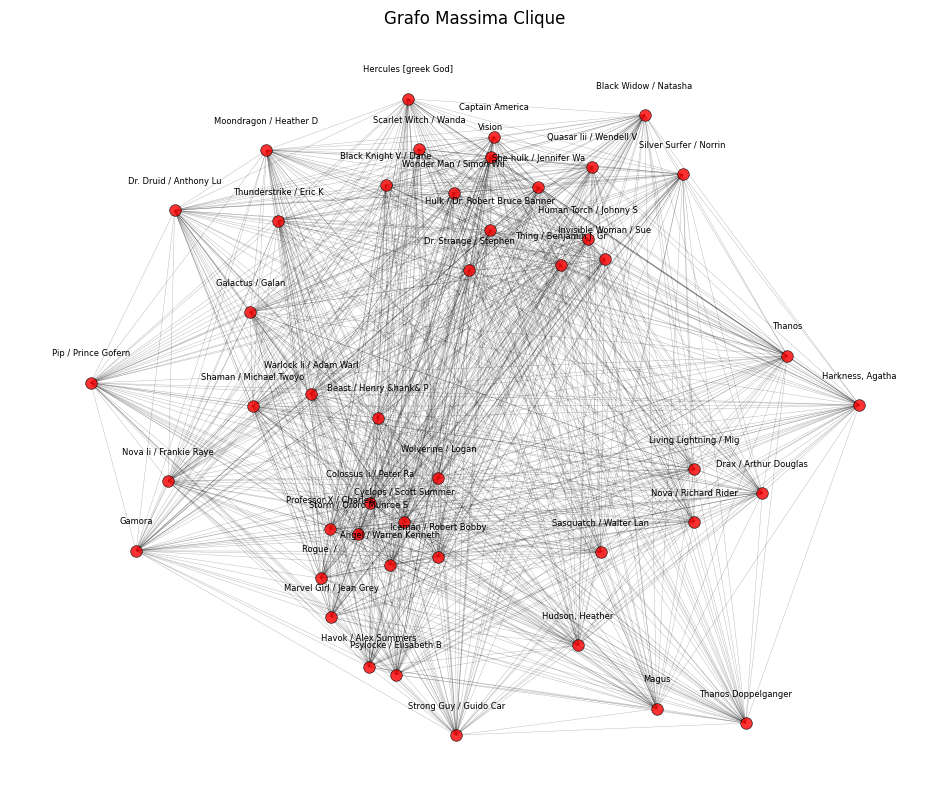

In [27]:
# Crea un sottografo solo con i nodi della massima clique
H = G.subgraph(max_clique)

pos = nx.kamada_kawai_layout(G)

plt.figure(figsize=(12, 10))

# 2. Disegno nodi
nx.draw_networkx_nodes(
    H, pos,
    node_size=70,
    node_color="red",
    alpha=0.8,
    edgecolors="black",
    linewidths=0.5
)

# 3. Disegno archi
nx.draw_networkx_edges(
    H, pos,
    alpha=0.3,        # molto più leggero
    width=0.3
)

# 4. Label spostate con offset verticale
labels_H = {n: H.nodes[n].get("label", n) for n in H.nodes()}
label_pos_H = {n: (x, y + 0.03) for n, (x, y) in pos.items()}

nx.draw_networkx_labels(
    H, label_pos_H,
    labels_H,
    font_size=6
)

plt.title("Grafo Massima Clique")
plt.axis("off")
plt.show()


K-Core Massimo Trovato (k): 54
Numero di nodi nel k-core massimo: 68
Numero di archi nel k-core massimo: 2148


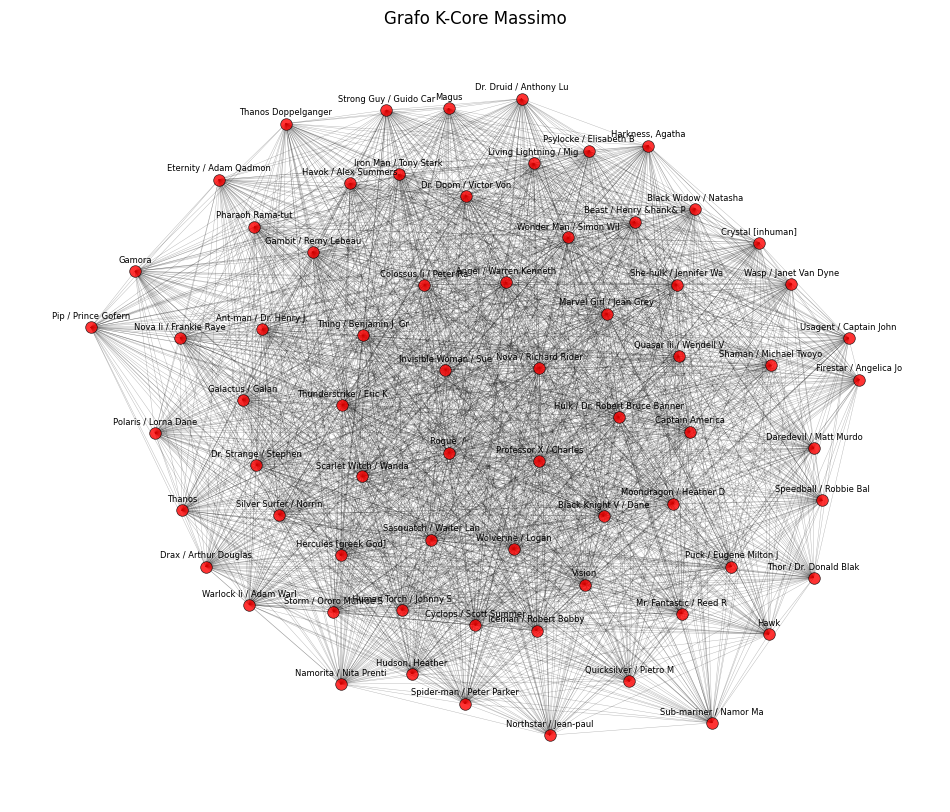

In [28]:
# --- 3. K-Core Decomposition ---
# Calculate the core number for each node
core_numbers = nx.core_number(G)
max_k_core = max(core_numbers.values())

print(f"K-Core Massimo Trovato (k): {max_k_core}")

# Trova i nodi appartenenti al k-core massimo
max_k_core_nodes = [n for n, k in core_numbers.items() if k == max_k_core]

# Crea il sottografo del k-core massimo
H_k_core = G.subgraph(max_k_core_nodes)

num_nodi_k_core = H_k_core.number_of_nodes()
num_archi_k_core = H_k_core.number_of_edges()

print(f"Numero di nodi nel k-core massimo: {num_nodi_k_core}")
print(f"Numero di archi nel k-core massimo: {num_archi_k_core}")


# Disegna il sottografo
plt.figure(figsize=(12,10))


pos = nx.kamada_kawai_layout(H_k_core)  # disposizione "forza repulsiva" per chiarezza
# 2. Disegno nodi
nx.draw_networkx_nodes(
    H_k_core, pos,
    node_size=70,
    node_color="red",
    alpha=0.8,
    edgecolors="black",
    linewidths=0.5
)

# 3. Disegno archi
nx.draw_networkx_edges(
    H_k_core, pos,
    alpha=0.3,        # molto più leggero
    width=0.3
)

# 4. Label spostate con offset verticale
labels_H_k_core = {n: H_k_core.nodes[n].get("label", n) for n in H_k_core.nodes()}
label_pos_H_k_core = {n: (x, y + 0.03) for n, (x, y) in pos.items()}

nx.draw_networkx_labels(
    H_k_core, label_pos_H_k_core,
    labels_H_k_core,
    font_size=6
)

plt.title("Grafo K-Core Massimo")
plt.axis("off")
plt.show()



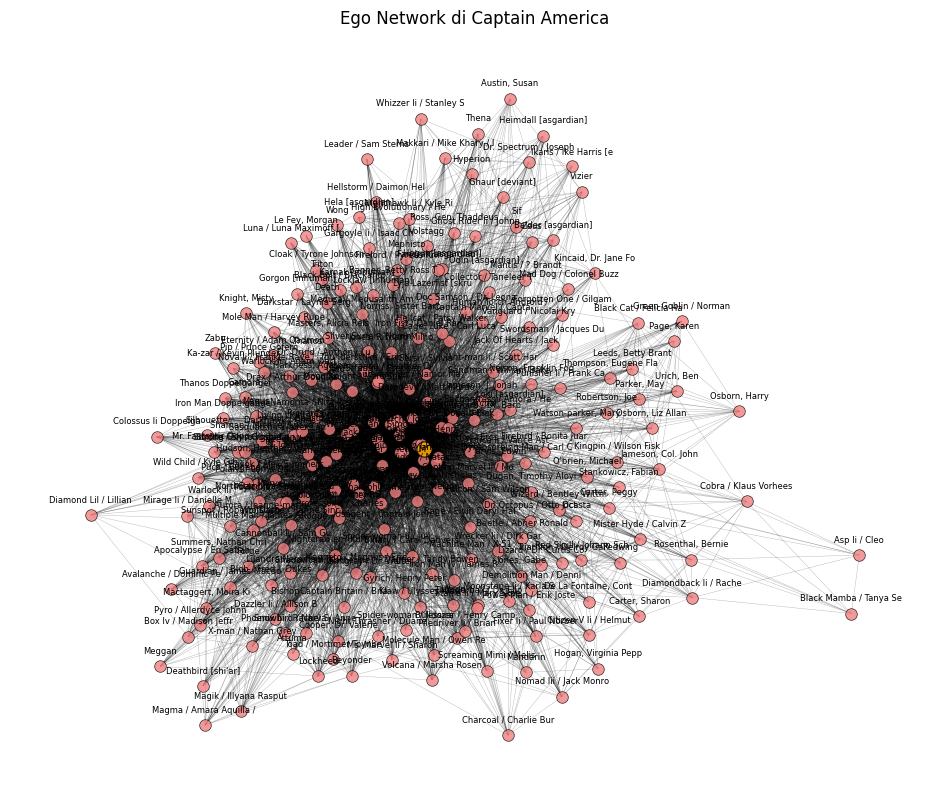

In [29]:
# --- 4. Ego Network --- # 
ego_node = "Captain America"

if ego_node in G:
    ego_net = nx.ego_graph(G, ego_node, radius=1)
    
    plt.figure(figsize=(12,10))

    # Layout Kamada-Kawai
    pos = nx.spring_layout(ego_net, seed=42)
    
    # Disegna vicini (alter)
    neighbors = list(ego_net.nodes())
    neighbors.remove(ego_node)
    nx.draw_networkx_nodes(
        ego_net, pos,
        nodelist=neighbors,
        node_size=70,
        node_color="lightcoral",
        alpha=0.8,
        edgecolors="black",
        linewidths=0.5,
        label="Vicini"
    )

    # Disegna l'ego
    nx.draw_networkx_nodes(
        ego_net, pos,
        nodelist=[ego_node],
        node_size=120,
        node_color="orange",
        alpha=0.9,
        edgecolors="black",
        linewidths=0.8,
        label="Ego"
    )

    # Disegna archi
    nx.draw_networkx_edges(
        ego_net, pos,
        alpha=0.3,
        width=0.3
    )

    # Etichette con offset verticale
    labels_ego_net = {n: ego_net.nodes[n].get("label", n) for n in ego_net.nodes()}
    label_pos_ego_net = {n: (x, y + 0.03) for n, (x, y) in pos.items()}
    nx.draw_networkx_labels(
        ego_net, label_pos_ego_net,
        labels_ego_net,
        font_size=6
    )

    plt.title(f"Ego Network di {ego_node}")
    plt.axis("off")
    plt.show()
else:
    print(f"Nodo '{ego_node}' non presente nel grafo.")


Ego Network di Captain America (filtrato ai 30 vicini con maggior degree centrality)


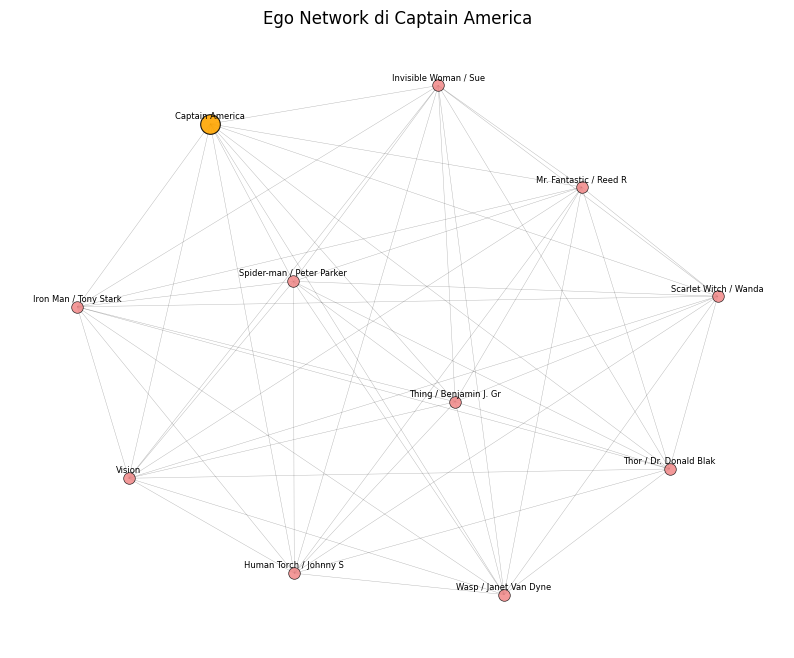

In [30]:
# --- 4. Ego Network --- # 
ego_node = "Captain America"

if ego_node in G:
    ego_net = nx.ego_graph(G, ego_node, radius=1)

    # --- FILTRO NODI IMPORTANTI (per degree centrality) ---
    centrality = nx.degree_centrality(ego_net)
    neighbors = [n for n in ego_net.nodes() if n != ego_node]
    neighbors_sorted = sorted(neighbors, key=lambda n: centrality[n], reverse=True)
    top_neighbors = neighbors_sorted[:10]   # scegli quanti vicini tenere

    # crea un SOTTOGRAFO solo con ego + top_neighbors
    nodes_to_keep = top_neighbors + [ego_node]
    ego_net_filtered = ego_net.subgraph(nodes_to_keep).copy()
    # ----------------------------------------------

    plt.figure(figsize=(10,8))

    # Layout sul grafo FILTRATO
    pos = nx.spring_layout(ego_net_filtered, seed=42)

    # Disegna vicini (alter) FILTRATI
    neighbors_filtered = [n for n in ego_net_filtered.nodes() if n != ego_node]
    nx.draw_networkx_nodes(
        ego_net_filtered, pos,
        nodelist=neighbors_filtered,
        node_size=70,
        node_color="lightcoral",
        alpha=0.8,
        edgecolors="black",
        linewidths=0.5,
        label="Vicini"
    )

    # Disegna l'ego
    nx.draw_networkx_nodes(
        ego_net_filtered, pos,
        nodelist=[ego_node],
        node_size=200,
        node_color="orange",
        alpha=0.9,
        edgecolors="black",
        linewidths=0.8,
        label="Ego"
    )

    # Disegna archi
    nx.draw_networkx_edges(
        ego_net_filtered, pos,
        alpha=0.3,
        width=0.3
    )

    # Etichette solo sui nodi FILTRATI
    labels_ego_net = {n: ego_net_filtered.nodes[n].get("label", n)
                      for n in ego_net_filtered.nodes()}
    label_pos_ego_net = {n: (x, y + 0.03) for n, (x, y) in pos.items()}
    nx.draw_networkx_labels(
        ego_net_filtered, label_pos_ego_net,
        labels_ego_net,
        font_size=6
    )

    plt.title(f"Ego Network di {ego_node}")
    print(f"Ego Network di {ego_node} (filtrato ai 30 vicini con maggior degree centrality)")
    plt.axis("off")
    plt.show()
else:
    print(f"Nodo '{ego_node}' non presente nel grafo.")


In [44]:
import community as community_louvain # A popular library for Louvain algorithm
# Louvain community detection
# The partition variable will be a dictionary where keys are nodes and values are their community ID.
partition = community_louvain.best_partition(G, weight='Weight')

print(f"Communities detected: {len(set(partition.values()))}")

# Add the community ID as a node attribute
nx.set_node_attributes(G, partition, 'community')

# Convert the partition dictionary to a DataFrame for easier analysis
community_df = pd.DataFrame(list(partition.items()), columns=['Character', 'Community_ID'])

# Calculate the size of each community and find the largest ones
community_size = community_df.groupby('Community_ID').size().sort_values(ascending=False)

# Get the top 5 largest communities
top_communities = community_size.head(5)

# Get the ID of the largest community
largest_community_id = top_communities.index[0]

# Get the characters in the largest community
largest_community_members = community_df[community_df['Community_ID'] == largest_community_id]['Character'].tolist()

print(f"Total number of communities detected: {len(community_size)}")
print("\nTop 5 largest communities by size:")
print(top_communities)
print(f"\nCharacters in the largest community (ID: {largest_community_id}) - first 20 members:")
print(largest_community_members[:20])

# To save the communities for later use, we can export the DataFrame
community_df.to_csv('marvel_communities.csv', index=False)

Communities detected: 7
Total number of communities detected: 7

Top 5 largest communities by size:
Community_ID
2    93
4    87
0    39
3    38
1    27
dtype: int64

Characters in the largest community (ID: 2) - first 20 members:
['Iceman / Robert Bobby', 'Marvel Girl / Jean Grey', 'Cyclops / Scott Summer', 'Wolverine / Logan', 'Colossus Ii / Peter Ra', 'Nightcrawler / Kurt Wa', 'Angel / Warren Kenneth', 'Storm / Ororo Munroe S', 'Toad / Mortimer Toynbe', 'Sunfire / Shiro Yoshid', 'Magneto / Magnus / Eric', 'Professor X / Charles', 'Captain Britain / Bria', 'Shadowcat / Katherine', 'Beast / Henry &hank& P', 'Avalanche / Dominic Pe', 'Mystique / Raven Darkh', 'Pyro / Allerdyce Johnn', 'Destiny Ii / Irene Adl', 'Psylocke / Elisabeth B']


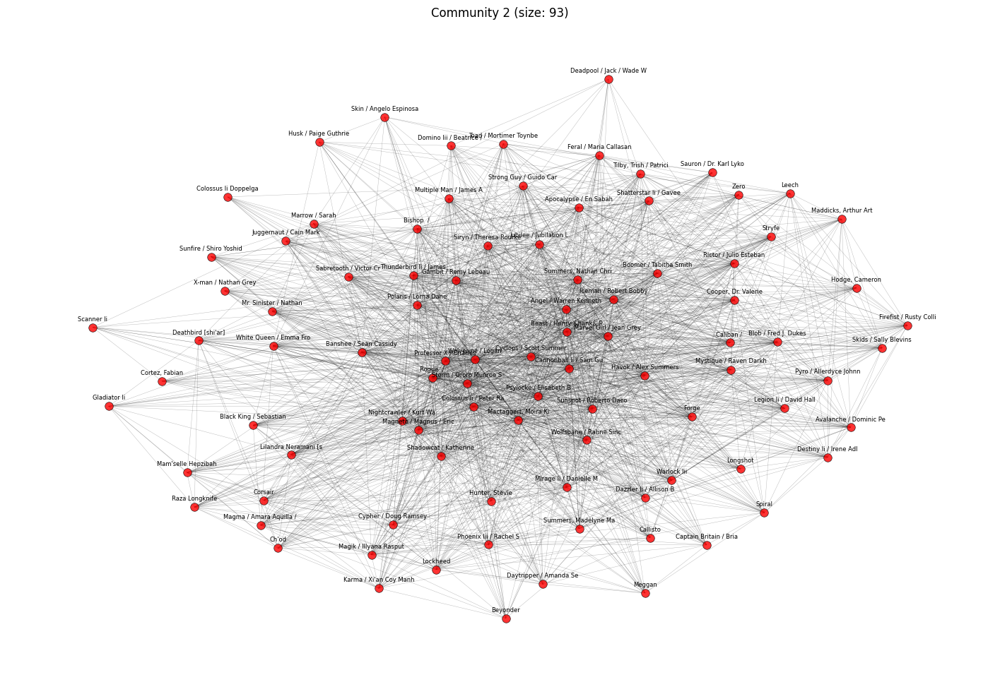

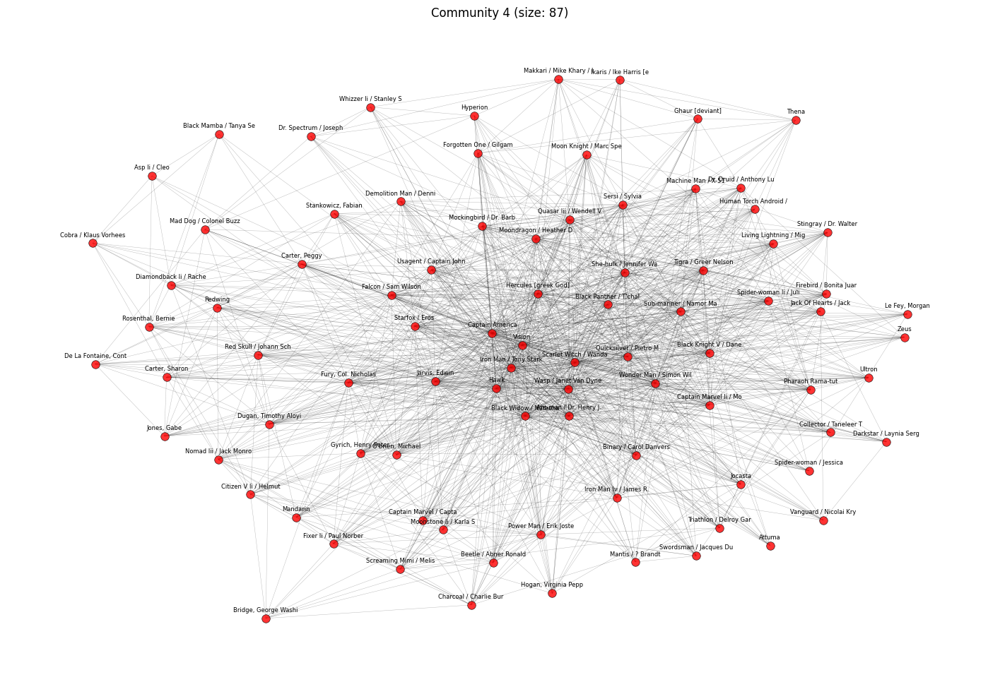

In [53]:
top_community_ids = community_size.index[:2]

# Creo e visualizzo due grafi separati usando la tua configurazione grafica
for idx, comm_id in enumerate(top_community_ids, start=1):
    members = community_df[community_df['Community_ID'] == comm_id]['Character'].tolist()
    sg = G.subgraph(members).copy()

    # =======================
    # 3. LAYOUT (POSIZIONAMENTO)
    # =======================
    pos = nx.spring_layout(sg, seed=42)  # layout force-directed
    pos = nx.kamada_kawai_layout(sg)     # layout più leggibile

    # =======================
    # 4. DISEGNO DEL GRAFO
    # =======================
    plt.figure(figsize=(18, 12))

    # Disegno nodi
    nx.draw_networkx_nodes(
        sg, pos,
        node_size=70,
        node_color="red",
        alpha=0.8,
        edgecolors="black",
        linewidths=0.5
    )

    # Disegno archi
    nx.draw_networkx_edges(
        sg, pos,
        alpha=0.3,
        width=0.3
    )

    # Label spostate con offset verticale
    labels = {n: sg.nodes[n].get("label", n) for n in sg.nodes()}
    label_pos = {n: (x, y + 0.03) for n, (x, y) in pos.items()}
    nx.draw_networkx_labels(
        sg, label_pos,
        labels,
        font_size=6
    )
    
    plt.title(f"Community {comm_id} (size: {sg.number_of_nodes()})")
    plt.axis("off")
    plt.show()

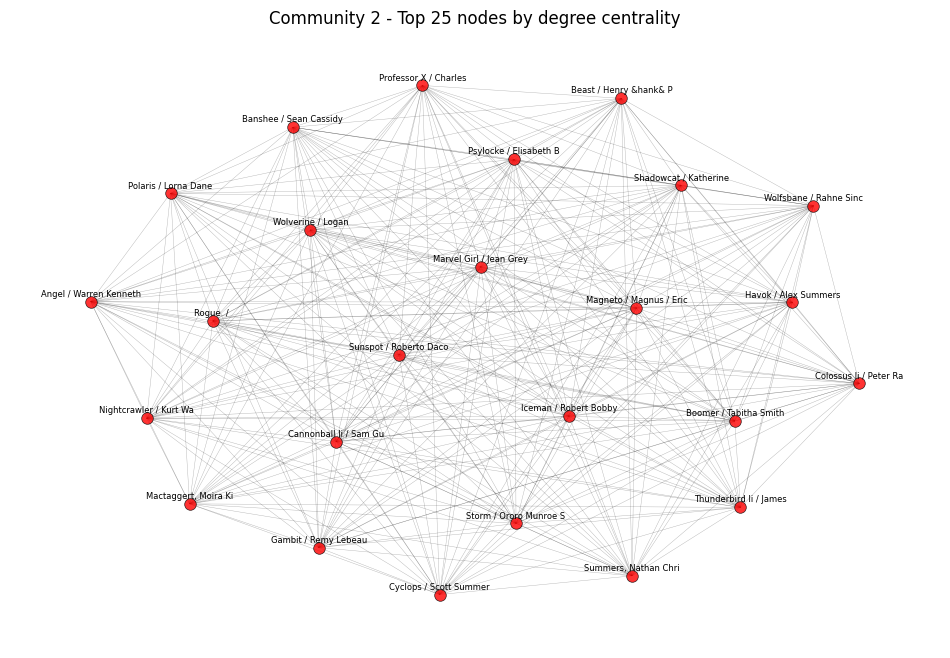

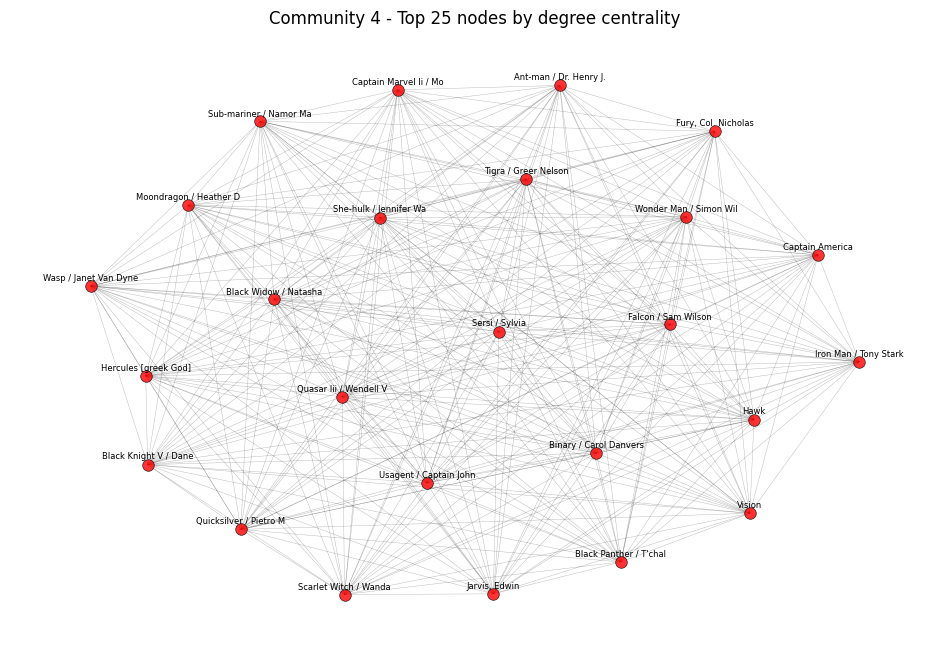

In [48]:
top_community_ids = community_size.index[:2]

# Creo e visualizzo due grafi separati filtrati per top 20 nodi per centralità
for idx, comm_id in enumerate(top_community_ids, start=1):
    members = community_df[community_df['Community_ID'] == comm_id]['Character'].tolist()
    sg = G.subgraph(members).copy()

    # Calcolo centralità di grado
    centrality = nx.degree_centrality(sg)
    top_nodes = sorted(centrality, key=centrality.get, reverse=True)[:25]

    # Creo sottografo solo con i top 20 nodi
    sg_top = sg.subgraph(top_nodes).copy()

    # =======================
    # 3. LAYOUT (POSIZIONAMENTO)
    # =======================
    pos = nx.spring_layout(sg_top)

    # =======================
    # 4. DISEGNO DEL GRAFO
    # =======================
    plt.figure(figsize=(12, 8))

    nx.draw_networkx_nodes(
        sg_top, pos,
        node_size=70,
        node_color="red",
        alpha=0.8,
        edgecolors="black",
        linewidths=0.5
    )

    nx.draw_networkx_edges(
        sg_top, pos,
        alpha=0.3,
        width=0.3
    )

    labels = {n: sg_top.nodes[n].get("label", n) for n in sg_top.nodes()}
    label_pos = {n: (x, y + 0.03) for n, (x, y) in pos.items()}
    nx.draw_networkx_labels(
        sg_top, label_pos,
        labels,
        font_size=6
    )

    plt.title(f"Community {comm_id} - Top 25 nodes by degree centrality")
    plt.axis("off")
    plt.show()

In [62]:
import networkx.algorithms.community as nx_comm
# 2. Create weighted graph G
G = nx.from_pandas_edgelist(
    edges_df,
    source='Source',
    target='Target',
    edge_attr='Weight',
    create_using=nx.Graph()
)

# 4. Run Louvain and get communities (list of sets)
# Use seed=42 for reproducibility
communities = nx_comm.louvain_communities(G, weight='Weight', seed=42)

# 5. Calculate Modularity
modularity = nx_comm.modularity(G, communities, weight='Weight')

# 6. Convert communities (list of sets) to a partition dictionary (node -> community_id)
partition = {}

for i, community in enumerate(communities):
    for node in community:
        partition[node] = i

communities_size = {i: len(c) for i, c in enumerate(communities)}
print(f"Community sizes: {communities_size}")

# 7. Create a DataFrame for analysis
analysis_df = pd.DataFrame(list(G.nodes()), columns=['Character'])
analysis_df['Community_ID'] = analysis_df['Character'].map(partition)
analysis_df['Betweenness_Centrality'] = analysis_df['Character'].map(betweenness_centrality)


# 10. Prepare results for printing
print(f"Coefficiente di Modularità: {modularity:.4f}")
print(f"Numero di Comunità Rilevate: {len(communities)}")

remap = {1: 4, 5: 2, 2: 5, 4: 1}
analysis_df['Community_ID'] = analysis_df['Community_ID'].replace(remap)

# Filtra solo le community 1 e 5
target_comms = [2, 4]

filtered_df = analysis_df[analysis_df['Community_ID'].isin(target_comms)]

# Ordina per Community_ID e Betweenness discendente
top5_comm_2_4 = (
    filtered_df
    .sort_values(['Community_ID', 'Betweenness_Centrality'], ascending=[True, False])
    .groupby('Community_ID')
    .head(5)         # prende i top 5
    .reset_index(drop=True)
)

print(top5_comm_2_4.to_string(index=False))

Community sizes: {0: 18, 1: 86, 2: 32, 3: 24, 4: 41, 5: 94, 6: 32}
Coefficiente di Modularità: 0.4354
Numero di Comunità Rilevate: 7
              Character  Community_ID  Betweenness_Centrality
 Beast / Henry &hank& P             2                0.292841
      Wolverine / Logan             2                0.186184
 Cyclops / Scott Summer             2                0.157628
 Cannonball Ii / Sam Gu             2                0.058575
Marvel Girl / Jean Grey             2                0.038900
        Captain America             4                0.531721
  Iron Man / Tony Stark             4                0.055177
                   Hawk             4                0.055064
  Scarlet Witch / Wanda             4                0.040453
                 Vision             4                0.025512


1. Comunità 4 (Avengers):

Captain America è il gatekeeper assoluto del gruppo, con un valore di Betweenness enormemente superiore a tutti gli altri. Ciò indica che la stragrande maggioranza dei percorsi più rapidi tra i membri degli Avengers (e i loro diretti alleati) passa attraverso di lui.

Iron Man / Tony Stark e Scarlet Witch / Wanda sono i successivi nodi cruciali.

2. Comunità 2 (X-Men):

Beast / Henry &hank& P è chiaramente il personaggio più centrale (il ponte) tra i mutanti, seguito da Wolverine / Logan e Cyclops / Scott Summer. Il fatto che Bestia sia il nodo di Betweenness più alto in questo gruppo ha senso, considerando il suo ruolo di intellettuale e diplomatico in diverse iterazioni degli X-Men e di altri team.

Q = 0.4354

Questo valore (nettamente superiore a $0.3$) indica che:La divisione in 7 comunità è eccellente.I personaggi all'interno di ciascuno dei 7 gruppi (come gli Avengers nella Comunità 1 e gli X-Men nella Comunità 5) hanno un numero di co-apparizioni (peso degli archi) molto più alto tra loro rispetto a quanto ci si aspetterebbe se le co-apparizioni fossero distribuite a caso nella rete.La struttura della comunità è robusta e i gruppi individuati sono significativi.In sintesi, la modularità ti conferma che l'analisi ha successo nell'identificare cluster di personaggi che interagiscono pesantemente tra loro e che sono relativamente isolati (anche se non completamente) dal resto della rete.

In [35]:
# Apply Greedy Modularity Community Detection
# The result is a list of sets, where each set is a community of nodes.
# This algorithm does not directly support weighted edges for community detection, but we can still proceed with the unweighted version for an initial analysis.
# To get a result closer to weighted analysis, we can use the "weight" in the edge data but the algorithm itself will treat it as unweighted.
# Let's check if the function takes a 'weight' parameter in the version installed.

G = nx.from_pandas_edgelist(
    edges_df,
    source='Source',
    target='Target',
    edge_attr='Weight'
)

try:
    communities = list(nx.community.greedy_modularity_communities(G, weight='Weight'))
except TypeError:
    # If the 'weight' parameter is not supported for this version or method, run unweighted.
    print("Warning: The 'greedy_modularity_communities' function does not support 'weight' parameter in this environment. Running unweighted.")
    communities = list(nx.community.greedy_modularity_communities(G))

# Convert the communities (list of sets) into a DataFrame
community_data = []
for i, community in enumerate(communities):
    for character in community:
        community_data.append({'Character': character, 'Community_ID': i})

community_df = pd.DataFrame(community_data)

# Calculate the size of each community and find the largest ones
community_size = community_df.groupby('Community_ID').size().sort_values(ascending=False)

# Get the top 5 largest communities
top_communities = community_size.head(5)

# Get the ID of the largest community
largest_community_id = top_communities.index[0]

# Get the characters in the largest community
largest_community_members = community_df[community_df['Community_ID'] == largest_community_id]['Character'].tolist()

print(f"Total number of communities detected: {len(community_size)}")
print("\nTop 5 largest communities by size:")
print(top_communities)
print(f"\nCharacters in the largest community (ID: {largest_community_id}) - first 20 members:")
print(largest_community_members[:20])

# Export the community data
community_df.to_csv('marvel_communities.csv', index=False)

Total number of communities detected: 7

Top 5 largest communities by size:
Community_ID
0    101
1     94
2     37
3     32
4     22
dtype: int64

Characters in the largest community (ID: 0) - first 20 members:
['Mantis / ? Brandt', 'Citizen V Ii / Helmut', 'Machine Man / X-51', 'Zeus', 'Gyrich, Henry Peter', 'Black Mamba / Tanya Se', "Black Panther / T'chal", 'Living Lightning / Mig', 'Usagent / Captain John', 'Mandarin', 'Triathlon / Delroy Gar', 'Stankowicz, Fabian', 'Tigra / Greer Nelson', 'Nova / Richard Rider', 'Black Widow / Natasha', 'Makkari / Mike Khary / I', 'Red Skull / Johann Sch', 'Ant-man / Dr. Henry J.', 'Ultron', 'Hyperion']


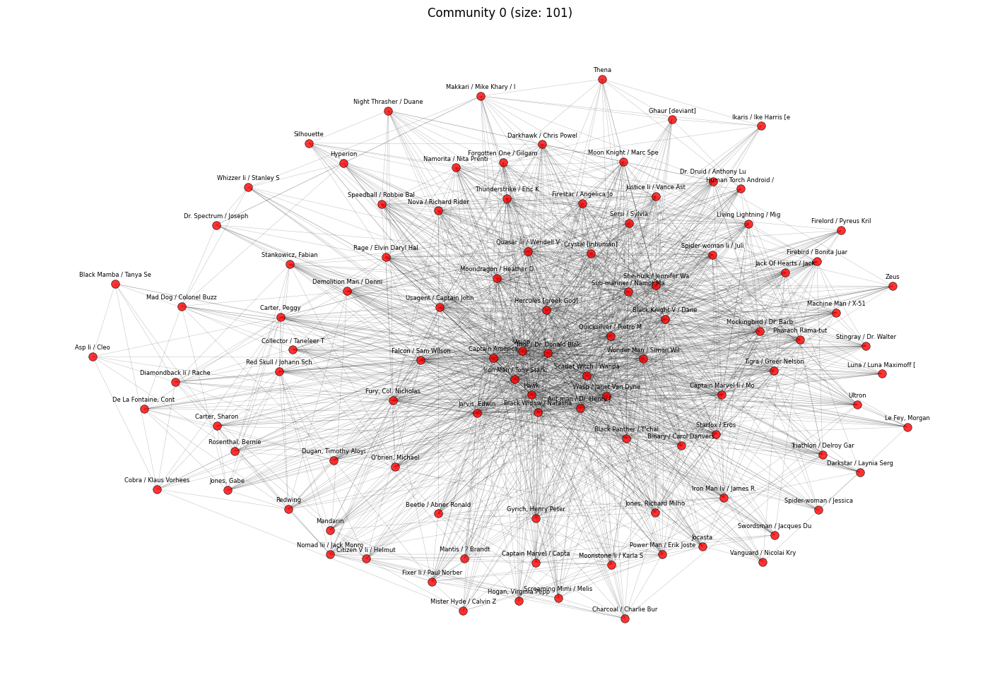

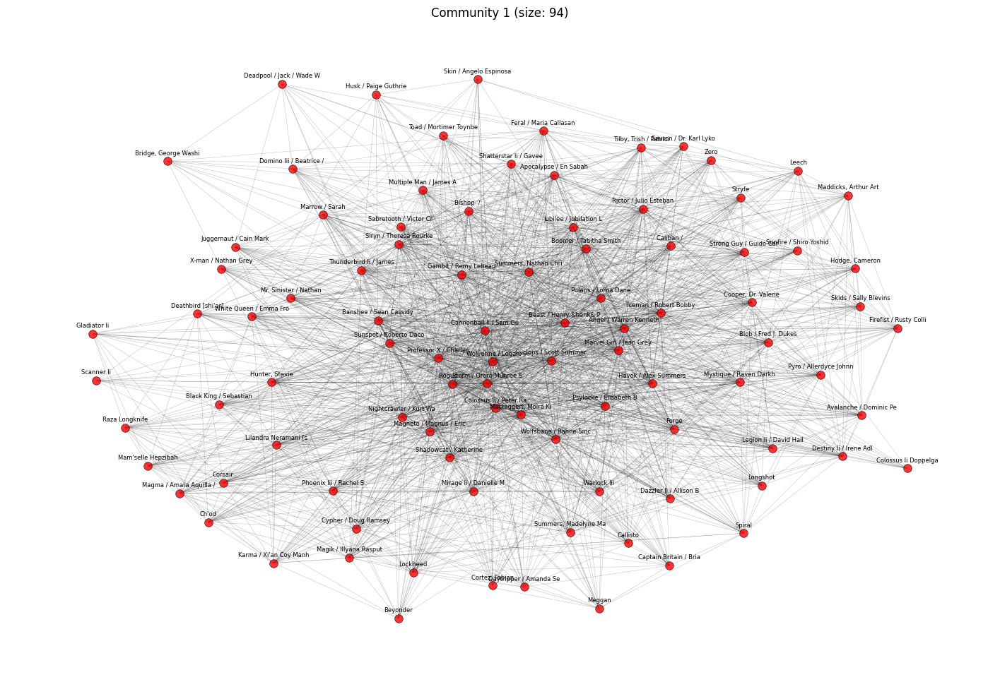

In [39]:
top_community_ids = community_size.index[:2]

# Creo e visualizzo due grafi separati usando la tua configurazione grafica
for idx, comm_id in enumerate(top_community_ids, start=1):
    members = community_df[community_df['Community_ID'] == comm_id]['Character'].tolist()
    sg = G.subgraph(members).copy()

    # =======================
    # 3. LAYOUT (POSIZIONAMENTO)
    # =======================
    pos = nx.spring_layout(sg, seed=42)  # layout force-directed
    pos = nx.kamada_kawai_layout(sg)     # layout più leggibile

    # =======================
    # 4. DISEGNO DEL GRAFO
    # =======================
    plt.figure(figsize=(18, 12))

    # Disegno nodi
    nx.draw_networkx_nodes(
        sg, pos,
        node_size=70,
        node_color="red",
        alpha=0.8,
        edgecolors="black",
        linewidths=0.5
    )

    # Disegno archi
    nx.draw_networkx_edges(
        sg, pos,
        alpha=0.3,
        width=0.3
    )

    # Label spostate con offset verticale
    labels = {n: sg.nodes[n].get("label", n) for n in sg.nodes()}
    label_pos = {n: (x, y + 0.03) for n, (x, y) in pos.items()}
    nx.draw_networkx_labels(
        sg, label_pos,
        labels,
        font_size=6
    )

    plt.title(f"Community {idx-1} (size: {sg.number_of_nodes()})")
    plt.axis("off")
    plt.show()

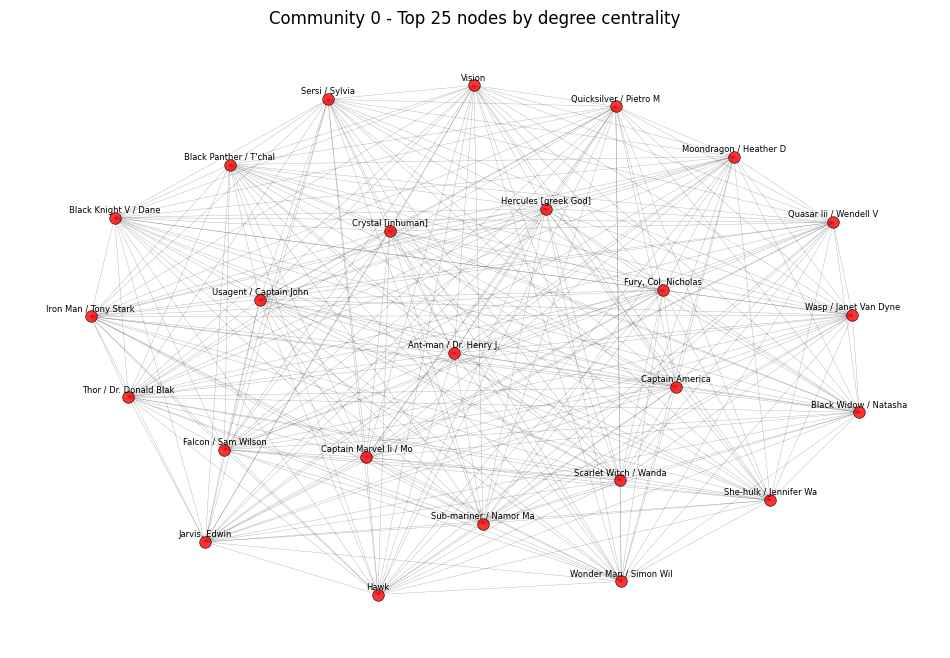

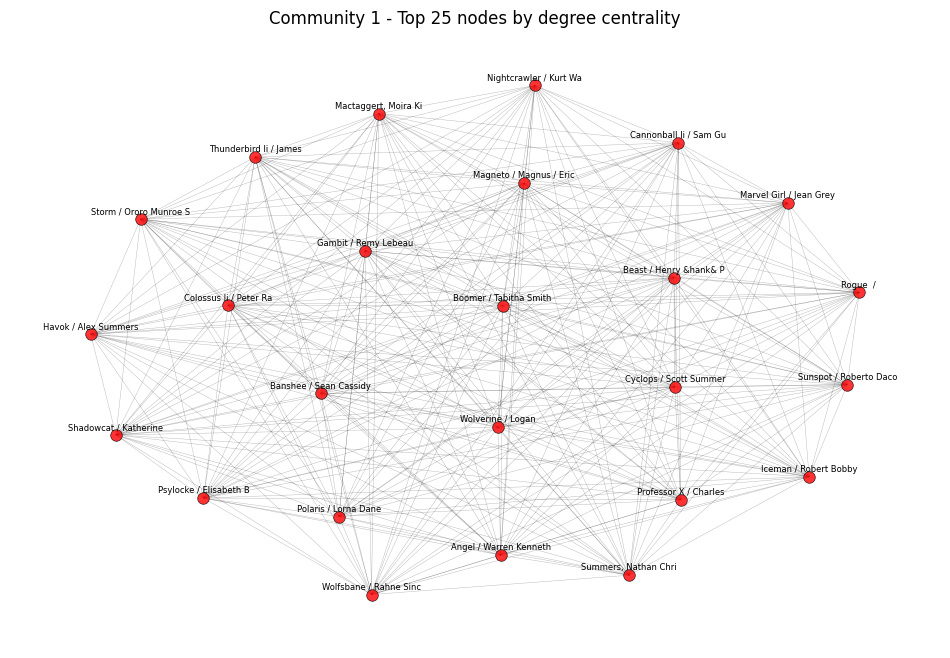

In [40]:
top_community_ids = community_size.index[:2]

# Creo e visualizzo due grafi separati filtrati per top 20 nodi per centralità
for idx, comm_id in enumerate(top_community_ids, start=1):
    members = community_df[community_df['Community_ID'] == comm_id]['Character'].tolist()
    sg = G.subgraph(members).copy()

    # Calcolo centralità di grado
    centrality = nx.degree_centrality(sg)
    top_nodes = sorted(centrality, key=centrality.get, reverse=True)[:25]

    # Creo sottografo solo con i top 20 nodi
    sg_top = sg.subgraph(top_nodes).copy()

    # =======================
    # 3. LAYOUT (POSIZIONAMENTO)
    # =======================
    pos = nx.spring_layout(sg_top)

    # =======================
    # 4. DISEGNO DEL GRAFO
    # =======================
    plt.figure(figsize=(12, 8))

    nx.draw_networkx_nodes(
        sg_top, pos,
        node_size=70,
        node_color="red",
        alpha=0.8,
        edgecolors="black",
        linewidths=0.5
    )

    nx.draw_networkx_edges(
        sg_top, pos,
        alpha=0.3,
        width=0.3
    )

    labels = {n: sg_top.nodes[n].get("label", n) for n in sg_top.nodes()}
    label_pos = {n: (x, y + 0.03) for n, (x, y) in pos.items()}
    nx.draw_networkx_labels(
        sg_top, label_pos,
        labels,
        font_size=6
    )

    plt.title(f"Community {idx-1} - Top 25 nodes by degree centrality")
    plt.axis("off")
    plt.show()

In [38]:
# 1. Create weighted graph G
# Using the df_edges loaded in the previous step
G = nx.from_pandas_edgelist(
    edges_df,
    source='Source',
    target='Target',
    edge_attr='Weight',
    create_using=nx.Graph()
)

# 5. Calculate Modularity for the detected partition
# Modularità should always be calculated using the original weight ('Weight')
modularity = nx_comm.modularity(G, communities, weight='Weight')

# 6. Convert communities (list of sets) to a partition dictionary (node -> community_id)
partition = {}
for i, community in enumerate(communities):
    for node in community:
        partition[node] = i

communities_size = {i: len(c) for i, c in enumerate(communities)}
print(f"Community sizes: {communities_size}")

# 7. Create a DataFrame for analysis
analysis_df = pd.DataFrame(list(G.nodes()), columns=['Character'])
analysis_df['Community_ID'] = analysis_df['Character'].map(partition)
analysis_df['Betweenness_Centrality'] = analysis_df['Character'].map(betweenness_centrality)


# 8. Prepare results for printing
print(f"Coefficiente di Modularità: {modularity:.4f}")
print(f"Numero di Comunità Rilevate: {len(communities)}")

# 9. Identify the two largest communities
community_sizes_series = analysis_df.groupby('Community_ID').size().sort_values(ascending=False)
top_2_comm_ids = community_sizes_series.index[:2].tolist()

print(f"\nLe due comunità più grandi sono gli ID: {top_2_comm_ids}")

# 10. Filtra e ordina per i Top 5 delle due comunità più grandi
filtered_df = analysis_df[analysis_df['Community_ID'].isin(top_2_comm_ids)]

top5_comm_1_2 = (
    filtered_df
    .sort_values(['Community_ID', 'Betweenness_Centrality'], ascending=[True, False])
    .groupby('Community_ID')
    .head(5)
    .reset_index(drop=True)
)

print("\n--- Top 5 Personaggi per le due Comunità più Grandi (Greedy Modularity) ---")
# Renaming column for cleaner output
top5_comm_1_2 = top5_comm_1_2.rename(columns={'Betweenness_Centrality': 'Betweenness_1/Peso'})
print(top5_comm_1_2.to_string(index=False))

Community sizes: {0: 101, 1: 94, 2: 37, 3: 32, 4: 22, 5: 22, 6: 19}
Coefficiente di Modularità: 0.4304
Numero di Comunità Rilevate: 7

Le due comunità più grandi sono gli ID: [0, 1]

--- Top 5 Personaggi per le due Comunità più Grandi (Greedy Modularity) ---
              Character  Community_ID  Betweenness_1/Peso
        Captain America             0            0.531721
 Thor / Dr. Donald Blak             0            0.121057
  Iron Man / Tony Stark             0            0.055177
                   Hawk             0            0.055064
  Scarlet Witch / Wanda             0            0.040453
 Beast / Henry &hank& P             1            0.292841
      Wolverine / Logan             1            0.186184
 Cyclops / Scott Summer             1            0.157628
 Cannonball Ii / Sam Gu             1            0.058575
Marvel Girl / Jean Grey             1            0.038900


Comunità 0: Gruppo Avengers/Centrale

È il gruppo principale che contiene i membri fondatori e più noti degli Avengers: Captain America (il nodo più centrale in assoluto), Thor, Iron Man, e Scarlet Witch.

La Betweenness Centrality del Capitano (0.53) lo identifica come il mediatore indiscusso della comunicazione in questo sottogruppo.

Comunità 1: Gruppo X-Men/Mutanti

Questo gruppo è nettamente composto da mutanti chiave: Beast, Wolverine, Cyclops, e Jean Grey (Marvel Girl).

Beast / Henry &hank& P è il nodo più centrale del gruppo X-Men, confermando il suo ruolo cruciale come scienziato e diplomatico che spesso collega diversi sottogruppi.

Nonostante l'algoritmo sia diverso, la struttura del network Marvel è così forte che entrambi i metodi (Louvain e Greedy Modularity) hanno identificato essenzialmente le stesse macro-comunità e gli stessi personaggi centrali.

Coefficiente di Modularità ($\mathcal{Q}$): 0.4304 (Leggermente inferiore a Louvain $\mathcal{Q}=0.4354$), ma comunque un valore eccellente che indica una forte struttura di comunità.

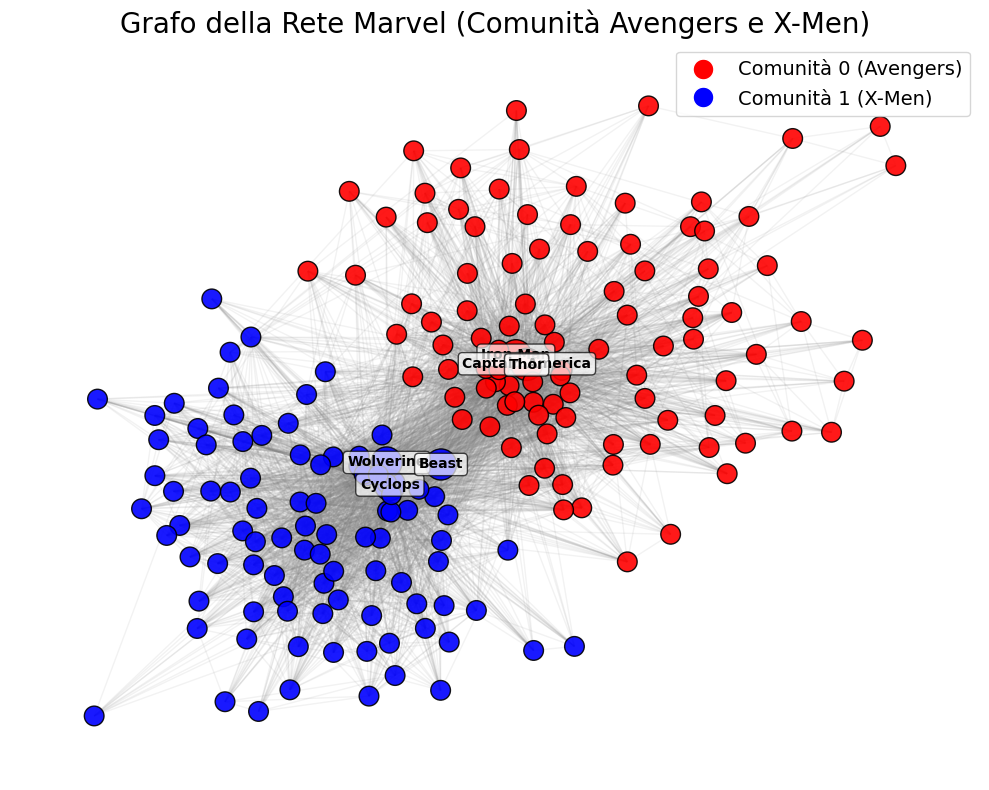

In [71]:
# 3. Identify Nodes in the two largest communities (ID 0 and ID 1)
# These correspond to Avengers and X-Men groups based on the previous analysis
nodes_to_keep = [node for node, comm_id in partition.items() if comm_id in [0, 1]]
G_sub = G.subgraph(nodes_to_keep)

# 4. Prepare data for plotting
# Identify the top central characters to highlight
top_central_chars = [
    'Captain America', 'Thor / Dr. Donald Blak', 'Iron Man / Tony Stark',
    'Beast / Henry &hank& P', 'Wolverine / Logan', 'Cyclops / Scott Summer'
]

# Set color map
community_map = {0: 'red', 1: 'blue'}
node_colors = [community_map[partition[node]] for node in G_sub.nodes()]

# Set size and label dictionaries
node_sizes = [500 if node in top_central_chars else 200 for node in G_sub.nodes()]
node_labels = {node: node.split('/')[0].strip() if node in top_central_chars else '' for node in G_sub.nodes()}

# 5. Generate the Plot
plt.figure(figsize=(10, 8))
plt.title("Grafo della Rete Marvel (Comunità Avengers e X-Men)", fontsize=20)

# Use spring layout for better visualization of clusters
pos = nx.spring_layout(G_sub, k=0.15, iterations=50, seed=42, weight='Weight')

# Draw nodes
nx.draw_networkx_nodes(G_sub, pos, node_size=node_sizes, node_color=node_colors, alpha=0.9, edgecolors='black', linewidths=1.0)

# Draw edges (setting color to light gray for background)
nx.draw_networkx_edges(G_sub, pos, alpha=0.1, edge_color='gray')

# Draw labels only for central characters
nx.draw_networkx_labels(G_sub, pos, labels=node_labels, font_size=10, font_weight='bold', font_color='black', bbox={"facecolor": "white", "alpha": 0.7, "boxstyle": "round,pad=0.3"})

# Create custom legend handles
from matplotlib.lines import Line2D
legend_handles = [
    Line2D([0], [0], marker='o', color='w', label='Comunità 0 (Avengers)', markerfacecolor='red', markersize=15),
    Line2D([0], [0], marker='o', color='w', label='Comunità 1 (X-Men)', markerfacecolor='blue', markersize=15)
]
plt.legend(handles=legend_handles, loc='best', fontsize=14)

plt.axis('off')
plt.tight_layout()
plt.show()
plt.close()


La visualizzazione mostra i personaggi nelle due comunità principali:
- Nodi Rossi: Rappresentano la Comunità 0 (Avengers).
- Nodi Blu: Rappresentano la Comunità 1 (X-Men).

I personaggi più centrali (quelli che hanno la Betweenness Centrality più alta, come Captain America e Beast) sono evidenziati da:
- Una dimensione maggiore del nodo.
- L'etichetta del nome visibile.

Interpretazione:
1. Cluster Distinti: Si può notare che i nodi rossi (Avengers) e blu (X-Men) formano due cluster ben separati. Questo conferma l'alta modularità ($\mathcal{Q}=0.4304$) della rete: le interazioni (archi) sono molto più frequenti all'interno di ciascun gruppo che tra i due gruppi.

2. Ruoli Centrali: All'interno di ciascun cluster, i nodi più grandi (come Captain America nel cluster rosso e Beast nel cluster blu) si trovano in posizioni chiave, spesso al centro del gruppo o fungendo da "ponte" verso gli altri membri, rispecchiando perfettamente il loro alto valore di Betweenness Centrality.